## BUSINESS CASE

###### Analyze FIFA football player data to explore skills and cluster players based on their attributes, providing insights into top-performing countries, player development, and compensation trends.

###### A thorough data analysis will be conducted, involving data exploration, visualization, and clustering techniques to identify patterns and trends in the data. The analysis will provide actionable insights for football teams, coaches, and scouts, enabling them to make informed decisions about player recruitment, development, and compensation.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

In [2]:
data=pd.read_csv('players_20.csv')

In [3]:
data

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


## Domain Analysis:

#### Domain: FIFA Football Players

#### Sub-Domains:

- Player Profile: Personal data (name, age, height, weight, nationality, club, position)
- Player Attributes: Skills and abilities (overall rating, potential, pace, shooting, passing, dribbling, defending, physical attributes)
- Goalkeeping Attributes: Specialized skills for goalkeepers (diving, handling, kicking, reflexes, positioning)
- Player Traits: Attacking, defending, and goalkeeping traits (crossing, finishing, heading accuracy, volleys)
- Player Positions: Various positions on the field (strikers, wingers, midfielders, defenders, goalkeepers)

#### Key Concepts:

- Player Performance: Overall ability and skills on the field
- Player Development: Growth and improvement over time
- Team Strategy: Tactical decisions made by a team (player positioning and formations)
- Player Comparison: Comparing players based on attributes, traits, and performance

#### Relationships:

- A player has multiple attributes and traits
- A player can play in multiple positions
- A team has multiple players with different attributes and traits
- A player's performance is influenced by their attributes, traits, and position

#### Assumptions:

1. The dataset is a comprehensive representation of FIFA football players
2. Attributes and traits are accurate measures of a player's abilities
3. Positions and formations are relevant to the game of football

#### Column Explanations:

- sofifa_id: Unique identifier for each player
- player_url: URL of the player's profile
- short_name and long_name: Player's nickname and full name
- age, dob, height_cm, and weight_kg: Player's personal details
- nationality and club: Player's country and team
- overall and potential: Player's overall rating and potential rating
- value_eur and wage_eur: Player's value and salary
- preferred_foot: Player's preferred foot (left or right)
- international_reputation: Player's international reputation rating
- weak_foot: Player's weaker foot rating
- skill_moves: Player's skill move rating
- work_rate: Player's work rate rating
- body_type: Player's body type
- real_face: Whether the player's face is scanned in the game
- release_clause_eur: Player's release clause value
- player_tags: Player's tags (e.g., dribbler, distance shooter)
- team_position and team_jersey_number: Player's team position and jersey number
- loaned_from: Player's loan status
- joined and contract_valid_until: Player's contract details
- nation_position and nation_jersey_number: Player's national team position and jersey number
- pace, shooting, passing, dribbling, defending, and physic: Player's attribute ratings
- gk_diving, gk_handling, gk_kicking, gk_reflexes, and gk_positioning: Goalkeeper attribute ratings
- player_traits: Player's traits (e.g., attacking, defending, goalkeeping)
- attacking_crossing, attacking_finishing, and attacking_heading_accuracy: Attacking trait ratings
- skill_dribbling, skill_curve, and skill_fk_accuracy: Skill ratings
- movement_acceleration, movement_sprint_speed, and movement_agility: Movement ratings
- power_shot_power, power_jumping, and power_stamina: Power ratings
- mentality_aggression, mentality_interceptions, and mentality_positioning: Mentality ratings
- defending_marking, defending_standing_tackle, and defending_sliding_tackle: Defending ratings
- goalkeeping_diving, goalkeeping_handling, and goalkeeping_kicking: Goalkeeping ratings
- player_positions: Player's positions on the field (e.g., LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB)

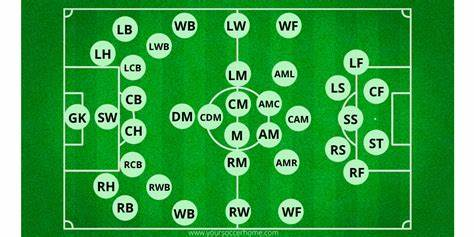

## Basic check

In [4]:
data.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=104)

In [5]:
# Summary statistics
print(data.describe())

           sofifa_id           age     height_cm     weight_kg       overall  \
count   18278.000000  18278.000000  18278.000000  18278.000000  18278.000000   
mean   219738.864482     25.283291    181.362184     75.276343     66.244994   
std     27960.200461      4.656964      6.756961      7.047744      6.949953   
min       768.000000     16.000000    156.000000     50.000000     48.000000   
25%    204445.500000     22.000000    177.000000     70.000000     62.000000   
50%    226165.000000     25.000000    181.000000     75.000000     66.000000   
75%    240795.750000     29.000000    186.000000     80.000000     71.000000   
max    252905.000000     42.000000    205.000000    110.000000     94.000000   

          potential     value_eur       wage_eur  international_reputation  \
count  18278.000000  1.827800e+04   18278.000000              18278.000000   
mean      71.546887  2.484038e+06    9456.942773                  1.103184   
std        6.139669  5.585481e+06   21351.714

In [6]:
# Data types
print(data.dtypes)

sofifa_id      int64
player_url    object
short_name    object
long_name     object
age            int64
               ...  
lb            object
lcb           object
cb            object
rcb           object
rb            object
Length: 104, dtype: object


In [7]:
# Missing values
print(data.isnull().sum())

sofifa_id        0
player_url       0
short_name       0
long_name        0
age              0
              ... 
lb            2036
lcb           2036
cb            2036
rcb           2036
rb            2036
Length: 104, dtype: int64


In [8]:
print(data.isnull().values.any())

True


In [9]:
print(data.isnull().sum().sum()) 

244935


In [10]:
data.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=104)

In [11]:
print(data.columns.tolist())

['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob', 'height_cm', 'weight_kg', 'nationality', 'club', 'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions', 'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type', 'real_face', 'release_clause_eur', 'player_tags', 'team_position', 'team_jersey_number', 'loaned_from', 'joined', 'contract_valid_until', 'nation_position', 'nation_jersey_number', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 'gk_positioning', 'player_traits', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_

####  EDA-Univariate, Bivariate & Multivariate analysis

###### First we need to  remover the special characters and  need to split the string

In [12]:
data = data.replace('[\#]','',regex=True)
data.head(3)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3


In [13]:
columns = ['ls', 'st', 'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm', 'rcm',
           'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb']
data[columns]

,ls,st,rs,lw,lf,cf,rf,rw,lam,cam,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,84+3,84+3,84+3,90+3,89+3,89+3,89+3,90+3,90+3,90+3,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,83+3,83+3,83+3,89+3,88+3,88+3,88+3,89+3,89+3,89+3,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18273,32+2,32+2,32+2,31+2,31+2,31+2,31+2,31+2,31+2,31+2,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,33+2,33+2,33+2,33+2,32+2,32+2,32+2,33+2,33+2,33+2,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,43+2,43+2,43+2,43+2,43+2,43+2,43+2,43+2,44+2,44+2,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,43+2,43+2,43+2,45+2,44+2,44+2,44+2,45+2,46+2,46+2,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2


###### The goal is to split the 'player_positions' column into separate columns, one for each position, and remove the '+' symbol with the values after them.

In [14]:
for colmun in columns:
    data[colmun] = data[colmun].str.split('+',expand=True)[0] # Split of string
data.head(1)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68,66,66,66,68,63,52,52,52,63


######  we split each column's values using the '+' symbol as the separator, and keep only the first part.

#### UNIVARIATE ANALYSIS

In [15]:
univariate = data[[ 'age',  'height_cm', 'weight_kg','overall', 'potential', 'value_eur', 'wage_eur', 
                   'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'work_rate', 'body_type',
                   'real_face', 'release_clause_eur', 'player_tags', 'team_position', 'team_jersey_number', 
                   'contract_valid_until', 'nation_position', 'nation_jersey_number', 'pace', 'shooting', 'passing',
                   'dribbling', 'defending', 'physic', 'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed', 
                   'gk_positioning','attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy',
                   'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 
                   'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 
                   'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 
                   'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
                   'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking',
                   'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 
                   'goalkeeping_kicking', 'goalkeeping_positioning', 'goalkeeping_reflexes', 'ls', 'st', 'rs', 'lw', 'lf', 
                   'cf', 'rf', 'rw', 'lam','cam', 'ram', 'lm', 'lcm', 'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb',
                   'lb', 'lcb', 'cb', 'rcb', 'rb']]

In [16]:
import sweetviz
sv = sweetviz.analyze(univariate)
sv.show_html()

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


#### Demographic Analysis

- Average age: 29 (16-45)
- Average height: 175-185cm (155-210cm)
- Average weight: 50-110kg

###### Player Ratings

- Average overall rating: 66 (45-95)
- Average potential rating: 66 (49-95)
- Average value: 2.5 million euros (105.5 million max)

###### Player Characteristics

- 75% right-footed, 25% left-footed
- Average international reputation: 1 (1-5)
- Average weak foot rating: 3 (1-5)
- Average skill moves rating: 2 (1-5)

###### Physical Attributes

- Average pace: 60-80
- Average shooting: 25-70
- Average passing: 57.2 (24-92)
- Average dribbling: 50-80
- Average defending: 50-70
- Average physical: 60-80

###### Goalkeeping Attributes

- Average goalkeeping diving: 60-70
- Average goalkeeping handling: 60-70
- Average goalkeeping kicking: 60-70
- Average goalkeeping positioning: 60-70
- Average goalkeeping reflexes: 60-70

###### Player Positions

- Average rating: 56-63 (similar across positions)

#### BIVARIATE AND MULTIVARIATE ANALYSIS

###### Impact of age (vs) movement reaction

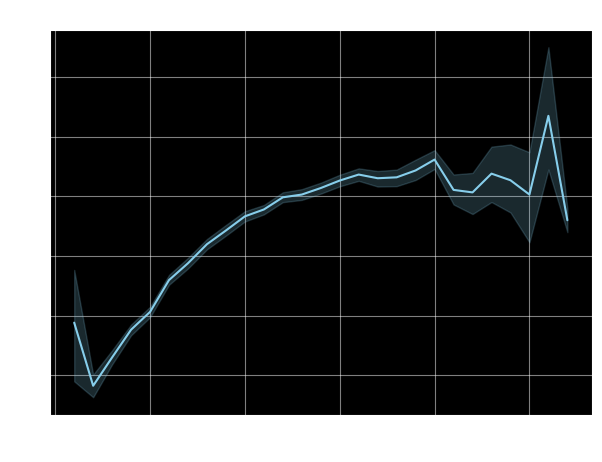

In [17]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='age', y='movement_reactions', data=data, color='skyblue')
plt.title('Impact of age (vs) movement reaction')
plt.xlabel('Age')
plt.ylabel('Movement Reactions')
plt.grid(True, alpha=0.5)
plt.show()

###### At the age 15 to 20 movement raction is less. If player age is increasing player movement reaction also increasing.

###### Impact of height (vs) Weight

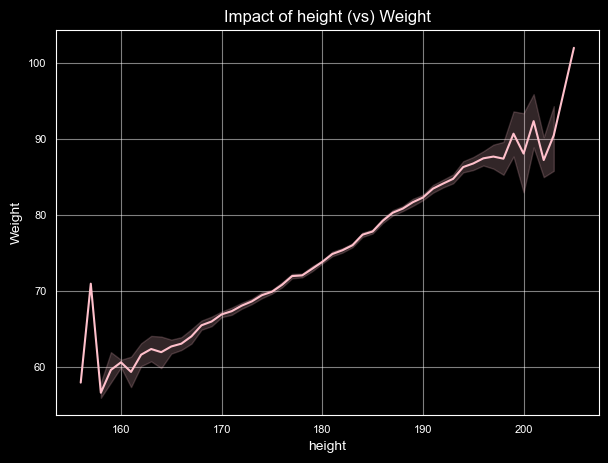

In [18]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='height_cm',y='weight_kg', data=data, color='pink')
plt.title('Impact of height (vs) Weight')
plt.xlabel('height')
plt.ylabel('Weight')
plt.grid(True, alpha=0.5)
plt.show()

###### If the players height is increases player weight also increases.

###### Relation between overall (vs) Potential with respect to preferred foot

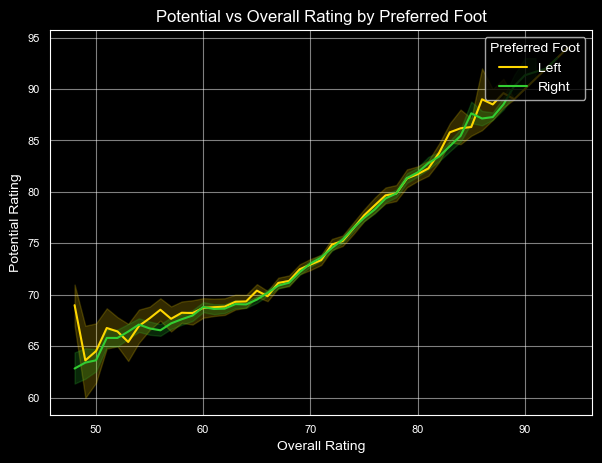

In [19]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='overall', y='potential', data=data, hue='preferred_foot', palette=['gold', 'limegreen'])
plt.title('Potential vs Overall Rating by Preferred Foot')
plt.xlabel('Overall Rating')
plt.ylabel('Potential Rating')
plt.grid(True, alpha=0.5)
plt.legend(title='Preferred Foot', loc='upper right')
plt.show()

###### Relation between value_eur (vs) wage_euro with respect to preferred foot

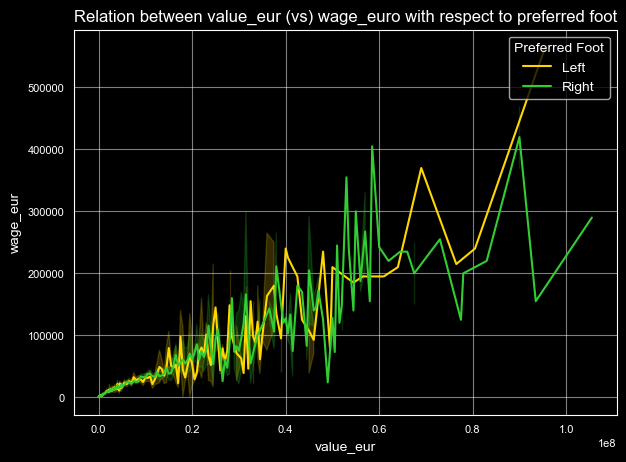

In [20]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='value_eur',y='wage_eur', data=data, hue='preferred_foot', palette=['gold', 'limegreen'])
plt.title('Relation between value_eur (vs) wage_euro with respect to preferred foot')
plt.xlabel('value_eur')
plt.ylabel('wage_eur')
plt.grid(True, alpha=0.5)
plt.legend(title='Preferred Foot', loc='upper right')
plt.show()

###### Impact of dribbling (VS) defending

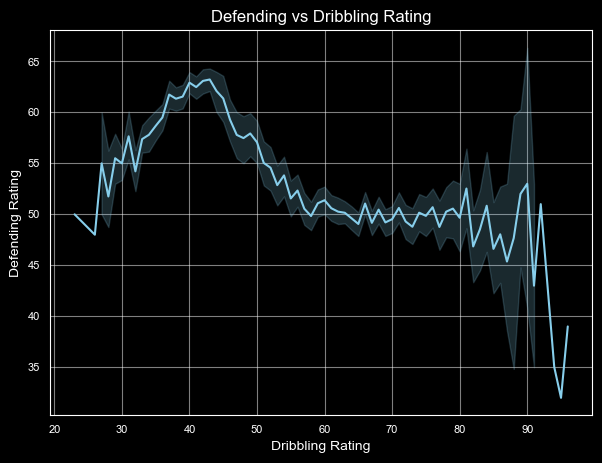

In [21]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='dribbling', y='defending', data=data, color='skyblue')
plt.title('Defending vs Dribbling Rating')
plt.xlabel('Dribbling Rating')
plt.ylabel('Defending Rating')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of physic (vs) attacking crossing

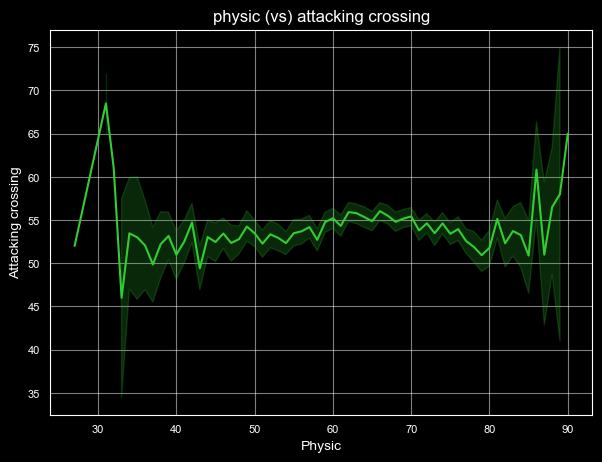

In [22]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='physic',y='attacking_crossing', data=data, color='limegreen')
plt.title('physic (vs) attacking crossing')
plt.xlabel('Physic')
plt.ylabel('Attacking crossing')
plt.grid(True, alpha=0.5)
plt.show()

###### Relation between pace (vs) shooting with respect to preferred foot

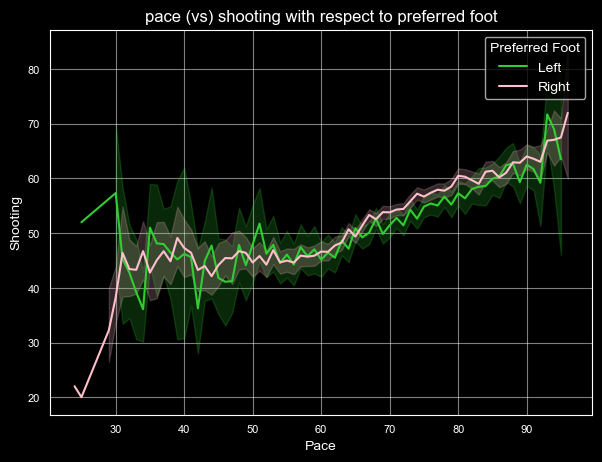

In [23]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='pace',y='shooting', data=data, hue='preferred_foot', palette=['limegreen', 'pink'])
plt.title('pace (vs) shooting with respect to preferred foot')
plt.xlabel('Pace')
plt.ylabel('Shooting')
plt.grid(True, alpha=0.5)
plt.legend(title='Preferred Foot', loc='upper right')
plt.show()

###### Impact of Goal keeper diving (vs) Goal keeper handling

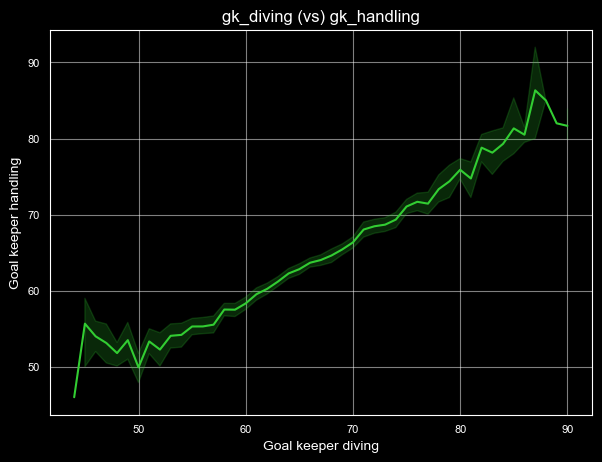

In [24]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='gk_diving',y='gk_handling', data=data, color='limegreen')
plt.title('gk_diving (vs) gk_handling')
plt.xlabel('Goal keeper diving')
plt.ylabel('Goal keeper handling')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of Goal keeper diving to Goal keeper handling

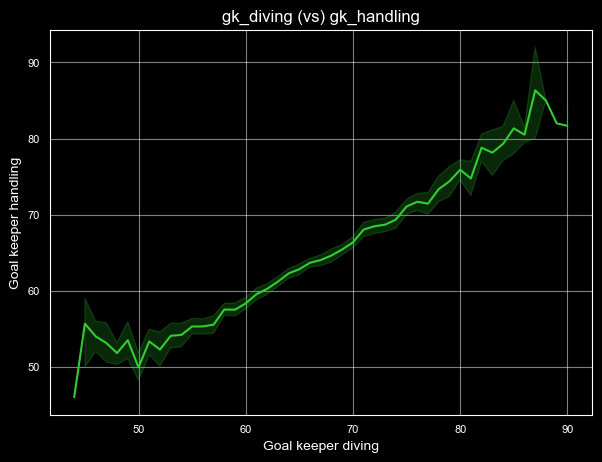

In [25]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='gk_diving',y='gk_handling', data=data, color='limegreen')
plt.title('gk_diving (vs) gk_handling')
plt.xlabel('Goal keeper diving')
plt.ylabel('Goal keeper handling')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of Goal keeper relaxes (vs) Goal keeper speed

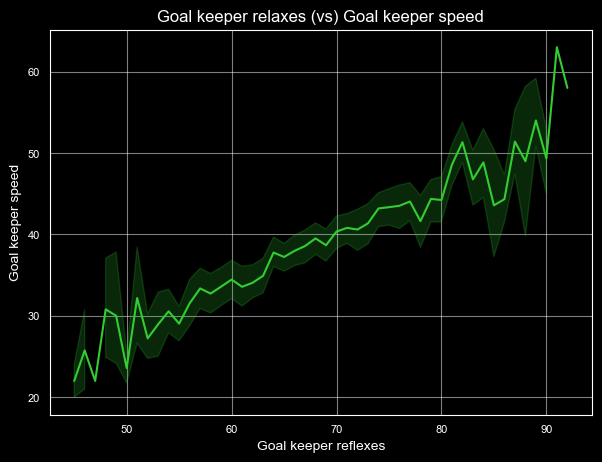

In [26]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='gk_reflexes',y='gk_speed', data=data, color='limegreen')
plt.title('Goal keeper relaxes (vs) Goal keeper speed')
plt.xlabel('Goal keeper reflexes')
plt.ylabel('Goal keeper speed')
plt.grid(True, alpha=0.5)
plt.show()

###### impact of Goal keeper positioning (vs) Goal keeper kicking

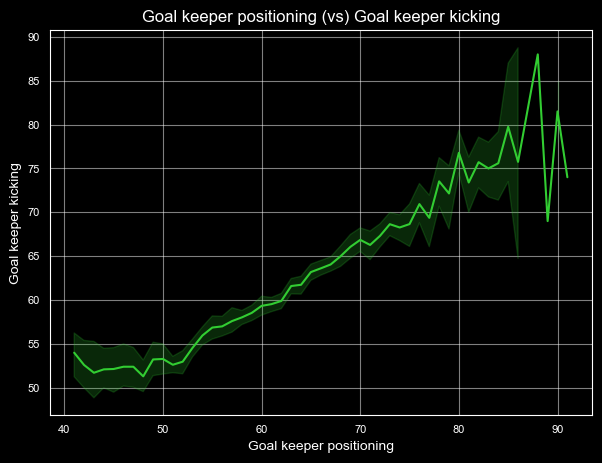

In [27]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='gk_positioning',y='gk_kicking', data=data, color='limegreen')
plt.title('Goal keeper positioning (vs) Goal keeper kicking')
plt.xlabel('Goal keeper positioning')
plt.ylabel('Goal keeper kicking')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of attacking crossing (vs) attacking finishing

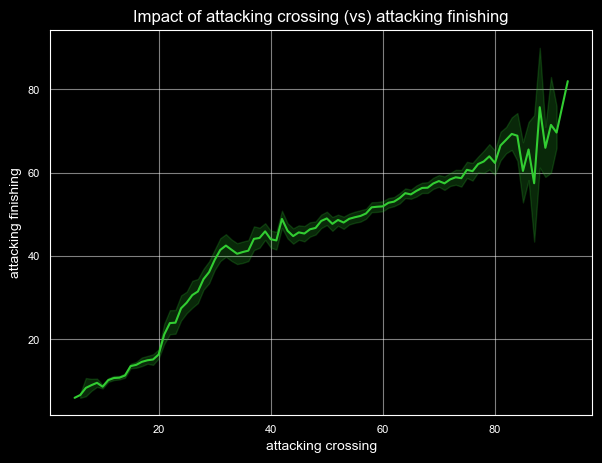

In [28]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='attacking_crossing',y='attacking_finishing', data=data, color='limegreen')
plt.title('Impact of attacking crossing (vs) attacking finishing')
plt.xlabel('attacking crossing')
plt.ylabel('attacking finishing')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of attacking short passing (vs) attacking volleys

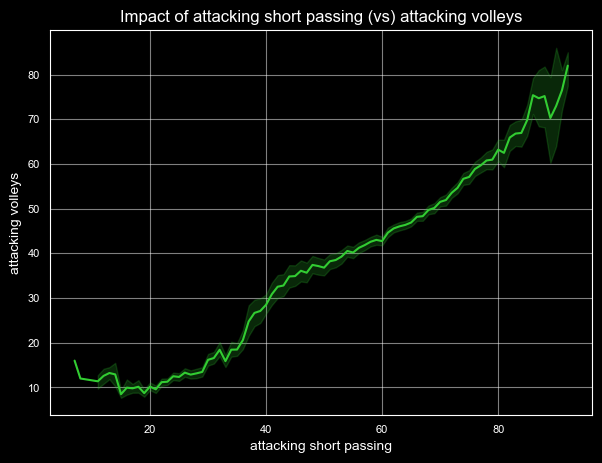

In [29]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='attacking_short_passing',y='attacking_volleys', data=data, color='limegreen')
plt.title('Impact of attacking short passing (vs) attacking volleys')
plt.xlabel('attacking short passing')
plt.ylabel('attacking volleys')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of skill dribbling (VS) skill ball control

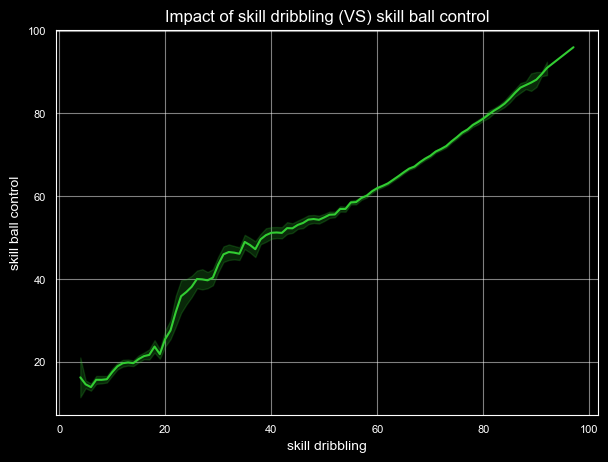

In [30]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='skill_dribbling',y='skill_ball_control', data=data, color='limegreen')
plt.title('Impact of skill dribbling (VS) skill ball control')
plt.xlabel('skill dribbling')
plt.ylabel('skill ball control')
plt.grid(True, alpha=0.5)
plt.show()

###### Relation between skill curve (or) skill fk accuracy with respect to preferred foot

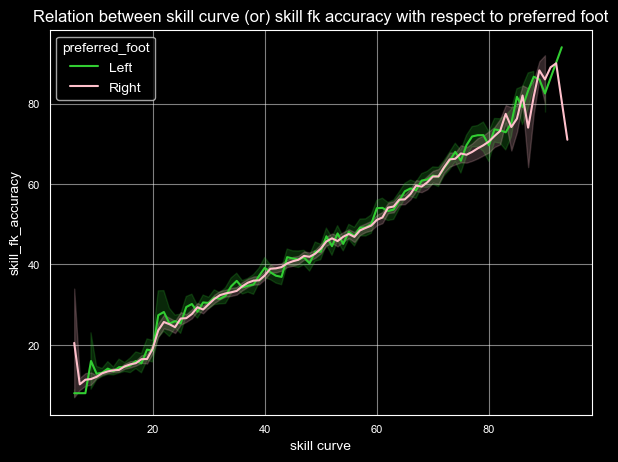

In [31]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='skill_curve',y='skill_fk_accuracy', data=data, hue='preferred_foot', palette=['limegreen', 'pink'])
plt.title('Relation between skill curve (or) skill fk accuracy with respect to preferred foot')
plt.xlabel('skill curve')
plt.ylabel('skill_fk_accuracy')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of skill long passing (vs) power long shots

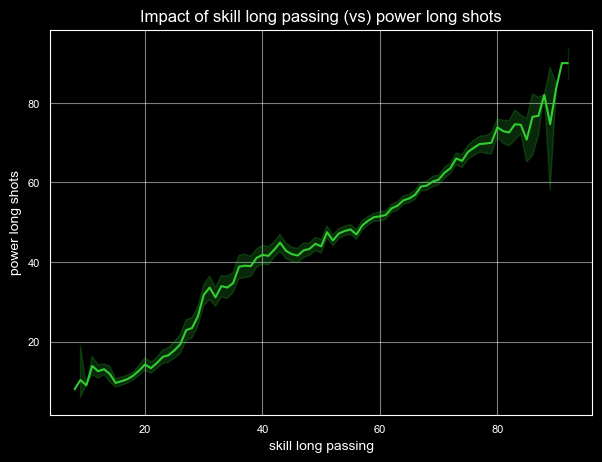

In [32]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='skill_long_passing',y='power_long_shots', data=data, color='limegreen')
plt.title('Impact of skill long passing (vs) power long shots')
plt.xlabel('skill long passing')
plt.ylabel('power long shots')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of movement sprint speed (vs) movement reaction

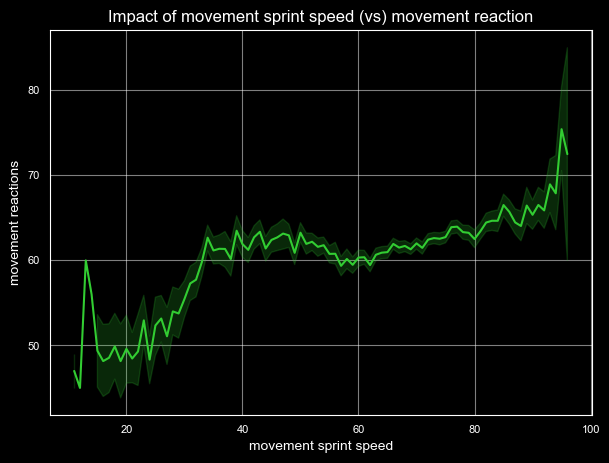

In [33]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='movement_sprint_speed',y='movement_reactions', data=data, color='limegreen')
plt.title('Impact of movement sprint speed (vs) movement reaction')
plt.xlabel('movement sprint speed')
plt.ylabel('movement reactions')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of power jumping (vs) power strength

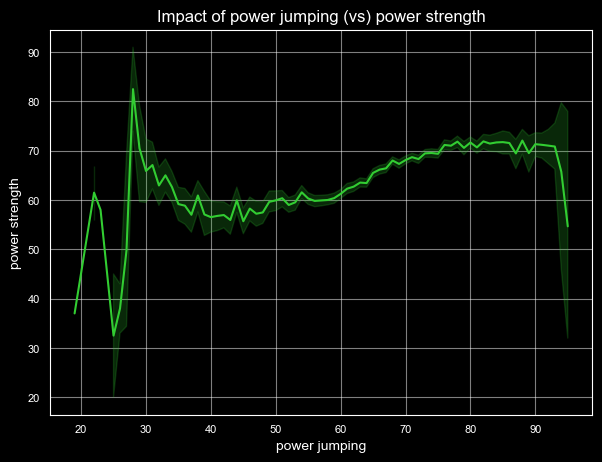

In [34]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='power_jumping',y='power_strength', data=data, color='limegreen')
plt.title('Impact of power jumping (vs) power strength')
plt.xlabel('power jumping')
plt.ylabel('power strength')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of power shot (vs) power stamina

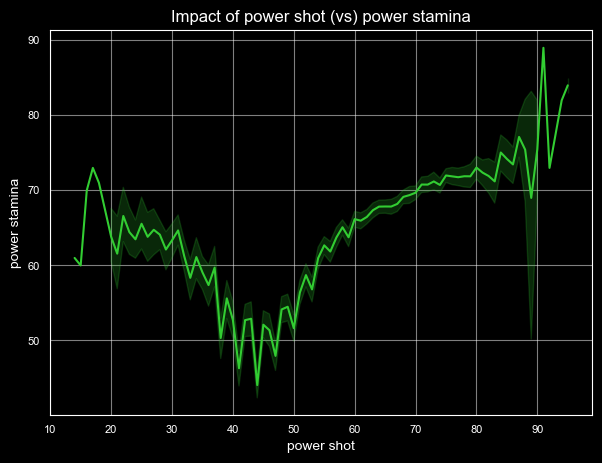

In [35]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='power_shot_power',y='power_stamina', data=data, color='limegreen')
plt.title('Impact of power shot (vs) power stamina')
plt.xlabel('power shot')
plt.ylabel('power stamina')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact to mentality aggression (vs) mentality positioning

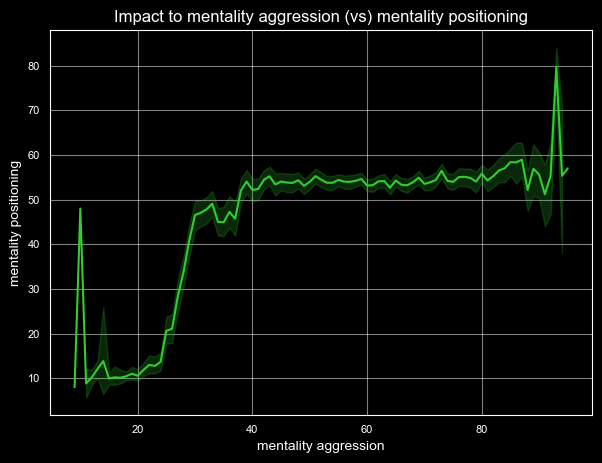

In [36]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='mentality_aggression',y='mentality_positioning', data=data, color='limegreen')
plt.title('Impact to mentality aggression (vs) mentality positioning')
plt.xlabel('mentality aggression')
plt.ylabel('mentality positioning')
plt.grid(True, alpha=0.5)
plt.show()

###### Relation between defending standing tackle (vs) defending sliding tackle with respect to preferred foot

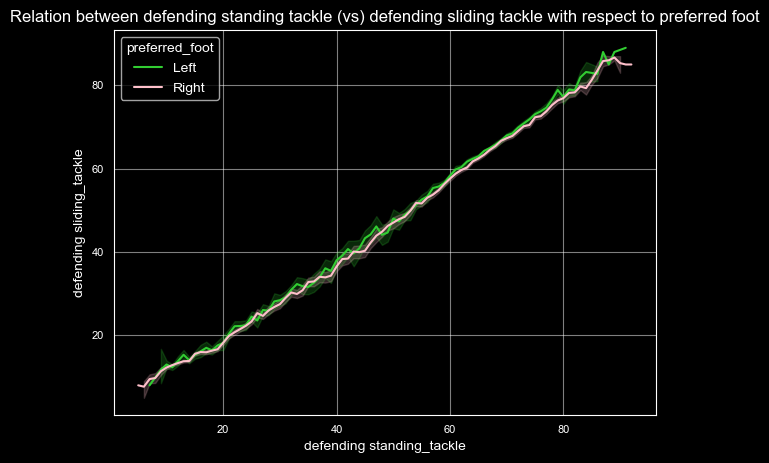

In [37]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.lineplot(x='defending_standing_tackle',y='defending_sliding_tackle', data=data, hue='preferred_foot', palette=['limegreen', 'pink'])
plt.title('Relation between defending standing tackle (vs) defending sliding tackle with respect to preferred foot')
plt.xlabel('defending standing_tackle')
plt.ylabel('defending sliding_tackle')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of international reputation (vs) weak foot

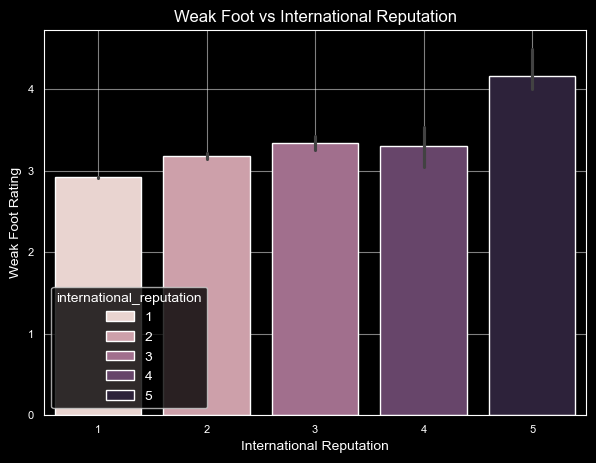

In [38]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.barplot(x='international_reputation', y='weak_foot', data=data, hue='international_reputation')
plt.title('Weak Foot vs International Reputation')
plt.xlabel('International Reputation')
plt.ylabel('Weak Foot Rating')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of work rate (vs) skill moves

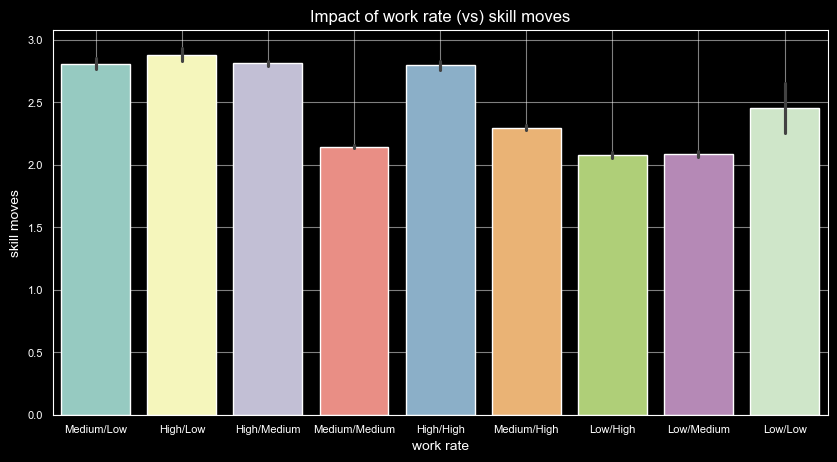

In [39]:
plt.figure(figsize=(10,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.barplot(x='work_rate', y='skill_moves', data=data, hue='work_rate')
plt.title('Impact of work rate (vs) skill moves')
plt.xlabel('work rate')
plt.ylabel('skill moves')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of real face (vs) release clause eur

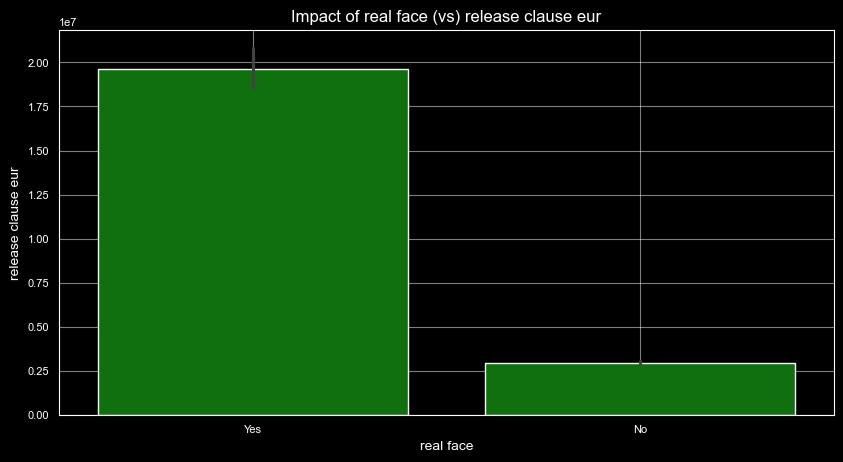

In [40]:
plt.figure(figsize=(10,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.barplot(x='real_face',y='release_clause_eur', data=data, color='#008000')
plt.title('Impact of real face (vs) release clause eur')
plt.xlabel('real face')
plt.ylabel('release clause eur')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of preferred foot (vs) pace

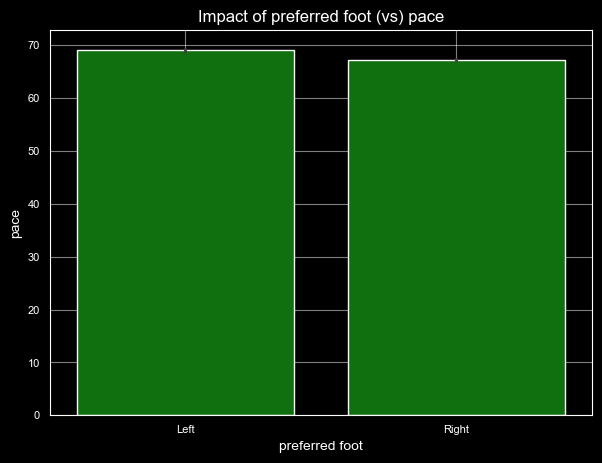

In [41]:
plt.figure(figsize=(7,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.barplot(x='preferred_foot',y='pace', data=data, color='#008000')
plt.title('Impact of preferred foot (vs) pace')
plt.xlabel('preferred foot')
plt.ylabel('pace')
plt.grid(True, alpha=0.5)
plt.show()

###### Impact of team position (vs) shooting

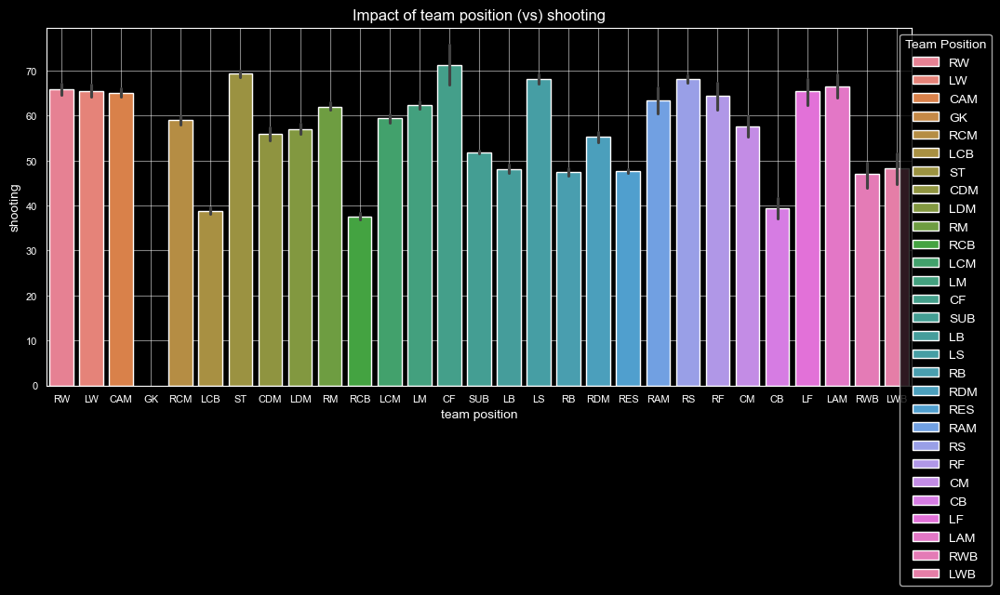

In [42]:
plt.figure(figsize=(12,5))
sns.set_style('dark')
plt.style.use('dark_background')
sns.barplot(x='team_position', y='shooting', data=data, hue='team_position')
plt.title('Impact of team position (vs) shooting')
plt.xlabel('team position')
plt.ylabel('shooting')
plt.grid(True, alpha=0.5)
plt.legend(title='Team Position', loc='upper right', bbox_to_anchor=(1.1, 1))
plt.show()

## Prepare a rank ordered list of top 10 countries with most players. Which countries are producing the most footballers that play at this level?

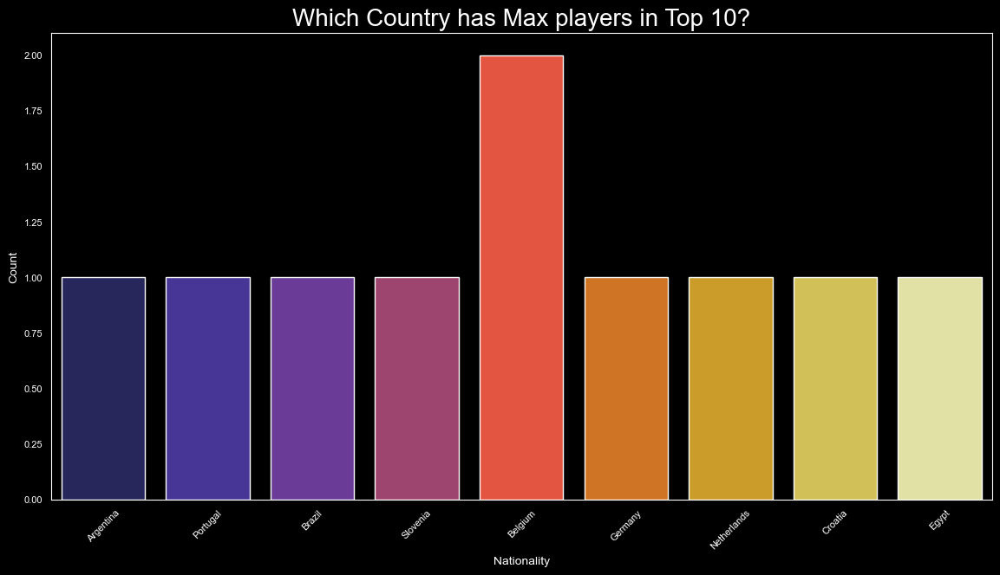

In [43]:
plt.figure(figsize=(14,7))
sns.countplot(x='nationality',data=data.head(10),palette='CMRmap')
plt.xlabel('Nationality')
plt.ylabel('Count')
plt.xticks(rotation=45) # used to tild the name on x axis
plt.title('Which Country has Max players in Top 10?',fontsize = 20)
plt.show()

###### The code creates a count plot to visualize the distribution of nationalities among the top 10 players in a dataset. The resulting plot shows that most of the players in the top 10 are from Belgium, suggesting a strong presence of Belgian players. This insight could be interesting for further analysis or exploration.

#### Top 10 club player

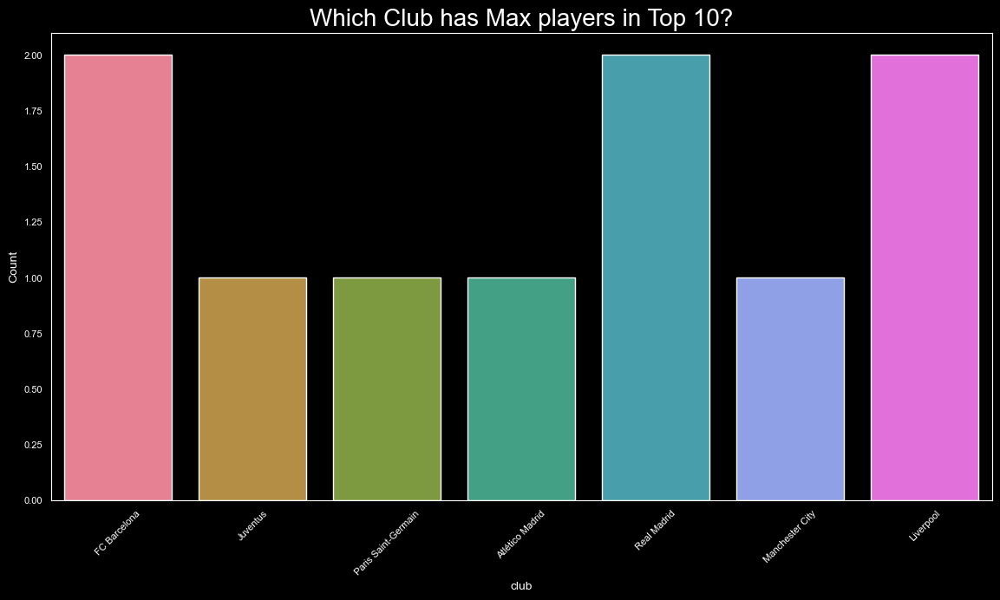

In [44]:
plt.figure(figsize=(14,7))
sns.countplot(x='club',data=data.head(10),palette='husl')
plt.xlabel('club')
plt.ylabel('Count')
plt.xticks(rotation=45) # used to tild the name on x axis
plt.title('Which Club has Max players in Top 10?',fontsize = 20)
plt.show()

###### The code creates a count plot to visualize the distribution of clubs among the top 10 players in a dataset. The resulting plot shows that most of the players in the top 10 are from FC Barcelona, Real Madrid, and Liverpool, suggesting a strong presence of these clubs in the top 10.

#### Team position in top 10

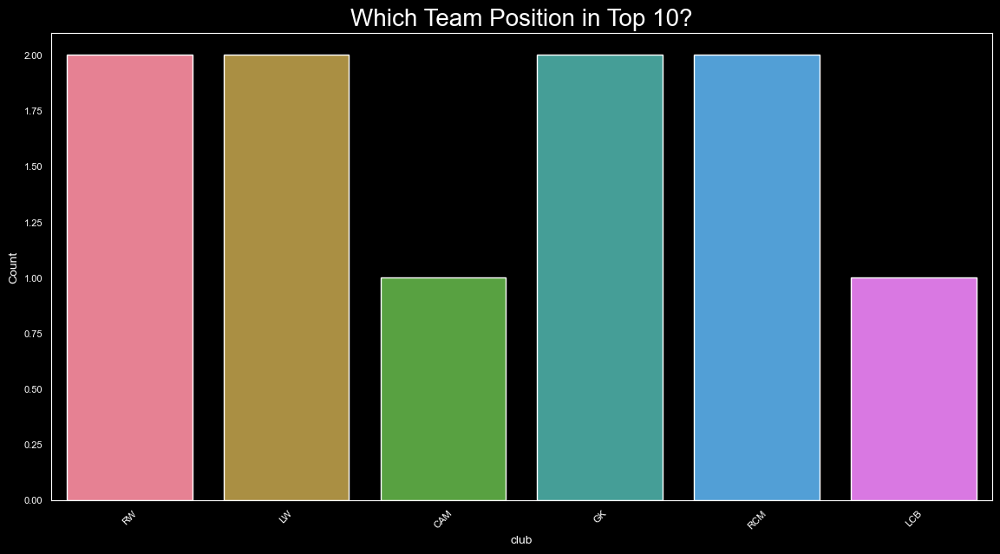

In [45]:
plt.figure(figsize=(14,7))
sns.countplot(x='team_position',data=data.head(10),palette='husl')
plt.xlabel('club')
plt.ylabel('Count')
plt.xticks(rotation=45) # used to tild the name on x axis
plt.title('Which Team Position in Top 10?',fontsize = 20)
plt.show()

###### The code creates a count plot to visualize the distribution of team positions among the top 10 players in a dataset. The resulting plot shows that most of the players in the top 10 hold positions such as Right Wing (RW), Left Wing (LW), Goalkeeper (GK), and Right Center Midfielder (RCM).

#### Campare Messi Vs Ronaldo

In [46]:
feature = data[['short_name','overall','potential','pace','shooting','passing','dribbling','defending','physic']]
compare = feature.head(2)
compare = compare.set_index('short_name')
compare.head()

,overall,potential,pace,shooting,passing,dribbling,defending,physic
short_name,,,,,,,,
L. Messi,94,94,87.0,92.0,92.0,96.0,39.0,66.0
Cristiano Ronaldo,93,93,90.0,93.0,82.0,89.0,35.0,78.0


###### The code selects key player features and sets the short name as the index, allowing for easy comparison of the top 2 players' attributes.

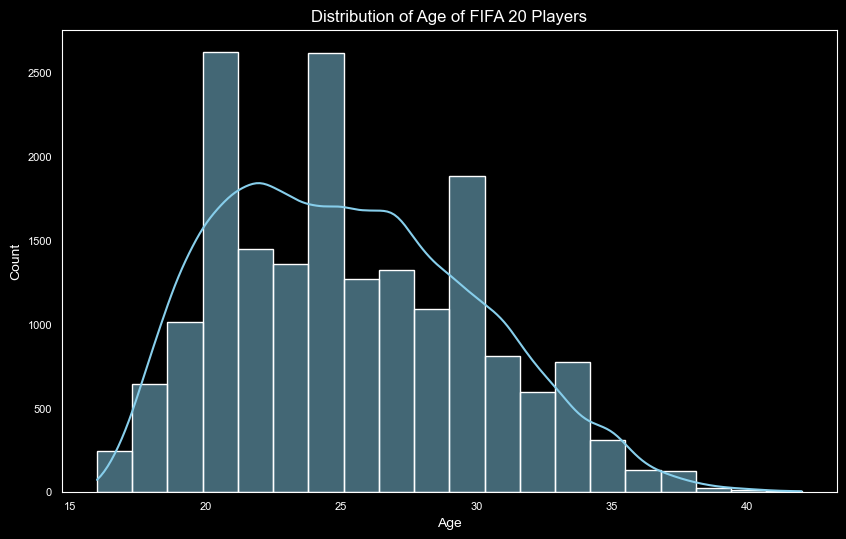

In [47]:
# Extract the age column from the dataset
age_data = data['age']
# Plot the distribution using a histogram
plt.figure(figsize=(10, 6))
sns.histplot(age_data, bins=20, kde=True, color='skyblue')
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Distribution of Age of FIFA 20 Players')
plt.show()

In [48]:
from scipy.stats import skew

age_data = 'age'
# Calculate the skewness of the 'age' column
age_skewness = skew(data[age_data])

# Output the skewness value
print(f"The skewness of 'age' column is: {age_skewness}")

The skewness of 'age' column is: 0.38058852415484473


###### The code calculates and prints the skewness of the 'age' column in the dataset, which is 0.38059, indicating a slightly right-skewed distribution.

In [49]:
print("The age of the youngest player is", data['age'].min())
print("The age of the oldest player is", data['age'].max())

The age of the youngest player is 16
The age of the oldest player is 42


###### The code identifies and prints the minimum and maximum values in the 'age' column, revealing the age range of players in the dataset, specifically the youngest player being 16 years old and the oldest being 42 years old.

In [50]:
data.loc[data['age'] == data['age'].min()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
4764,246618,https://sofifa.com/player/246618/adam-hlozek/2...,A. Hložek,Adam Hložek,16,2002-07-25,185,80,Czech Republic,Sparta Praha,...,52,50,50,50,52,49,46,46,46,49
6630,252037,https://sofifa.com/player/252037/fabio-daniel-...,Fábio Silva,Fábio Daniel Soares Silva,16,2002-07-19,185,75,Portugal,FC Porto,...,43,40,40,40,43,41,38,38,38,41
12158,252259,https://sofifa.com/player/252259/enzo-millot/2...,E. Millot,Enzo Millot,16,2002-07-17,175,65,France,AS Monaco,...,58,56,56,56,58,56,51,51,51,56
12160,247888,https://sofifa.com/player/247888/sebastiano-es...,S. Esposito,Sebastiano Esposito,16,2002-07-02,186,75,Italy,Inter,...,41,40,40,40,41,39,37,37,37,39
14626,252238,https://sofifa.com/player/252238/alan-velasco/...,A. Velasco,Alan Velasco,16,2002-07-27,167,63,Argentina,Independiente,...,55,54,54,54,55,55,50,50,50,55
17614,248187,https://sofifa.com/player/248187/daniel-obbekj...,D. Obbekjær,Daniel Obbekjær,16,2002-07-16,193,86,Denmark,Odense Boldklub,...,44,48,48,48,44,46,51,51,51,46
17782,248567,https://sofifa.com/player/248567/sebastian-and...,S. Anderson,Sebastian Anderson,16,2002-08-08,175,64,United States,Colorado Rapids,...,50,48,48,48,50,50,48,48,48,50
17827,251219,https://sofifa.com/player/251219/darragh-burns...,D. Burns,Darragh Burns,16,2002-08-06,176,62,Northern Ireland,St. Patrick's Athletic,...,43,39,39,39,43,42,36,36,36,42
18031,246815,https://sofifa.com/player/246815/oliver-stefan...,O. Stefánsson,Oliver Stefánsson,16,2002-08-03,190,75,Iceland,IFK Norrköping,...,43,45,45,45,43,46,50,50,50,46
18171,252892,https://sofifa.com/player/252892/joseph-starbu...,J. Starbuck,Joseph Starbuck,16,2002-08-03,174,69,England,Grimsby Town,...,44,43,43,43,44,43,40,40,40,43


###### The code filters the dataset to show all rows where the 'age' column is equal to the minimum age (16) and returns 12 players who are 16 years old. This suggests that there is a cluster of young players who, despite having average overall scores, may possess promising potential.

#### Display the total number of rows where the age is the minimum.

In [51]:
min_age_rows = data.loc[data['age'] == data['age'].min()]
total_rows_with_min_age = min_age_rows.shape[0]

print("Total number of rows with the minimum age:", total_rows_with_min_age)

Total number of rows with the minimum age: 12


##### A display of attributes of the oldest players.

In [52]:
data.loc[data['age'] == data['age'].max()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
11832,142998,https://sofifa.com/player/142998/cristian-muno...,C. Muñoz,Cristian Fernando Muñoz Hoffman,42,1977-07-01,177,73,Argentina,CD Universidad de Concepción,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13003,208927,https://sofifa.com/player/208927/hussain-omar-...,H. Sulaimani,Hussein Omar Abdul Ghani Sulaimani,42,1977-01-21,173,70,Saudi Arabia,Al Ahli,...,62,66,66,66,62,62,66,66,66,62


##### The code filters the dataset to show all rows where the 'age' column is equal to the maximum age (42) and returns only two players who are 42 years old, indicating that there are only a few experienced players in the dataset.

#### Distribution of Overall ratings

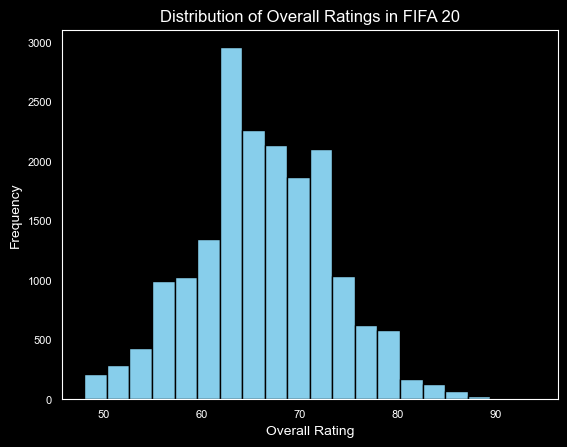

In [53]:
overall_ratings = data['overall']

plt.hist(overall_ratings, bins=20, edgecolor='black', color='skyblue')

plt.xlabel('Overall Rating')
plt.ylabel('Frequency')
plt.title('Distribution of Overall Ratings in FIFA 20')
# Show the plot
plt.show()

## Plot the distribution of overall rating vs. age of players. Interpret what is the age after which a player stops improving?

#### Impact Of Age On The Overall Rating

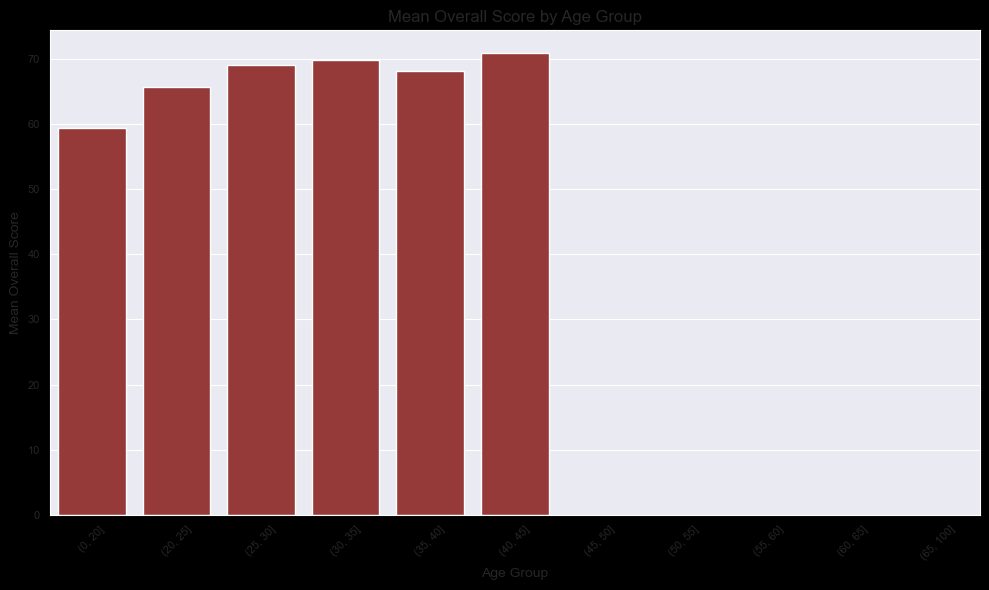

In [54]:
# Assuming you have the DataFrame 'data' with columns 'age' and 'overall'
# Define age intervals (you can adjust these intervals based on your data)
age_intervals = [0, 20, 25, 30, 35, 40, 45, 50, 55, 60, 65, 100]
# Categorize the 'age' column into intervals using pd.cut
data['age_group'] = pd.cut(data['age'], bins=age_intervals)
# Calculate the mean overall score for each age group
mean_overall_by_age_group = data.groupby('age_group')['overall'].mean().reset_index()
# Create a bar plot
plt.figure(figsize=(10, 6))
sns.set_style('darkgrid')
sns.barplot(x='age_group', y='overall', data=mean_overall_by_age_group, color='brown')
# Set labels and title

plt.xlabel('Age Group')
plt.ylabel('Mean Overall Score')
plt.title('Mean Overall Score by Age Group')
# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)
# Show the plot
plt.tight_layout()
plt.show()

###### The code provides a more detailed analysis of the relationship between age and overall scores, revealing a nuanced pattern of improvement and decline. The key findings are:

- Early Improvement: Players tend to experience a steady improvement in their overall scores from a young age until around 30-35 years old, suggesting that this age range is critical for skill development.

- Plateau: Beyond 30-35 years old, the mean overall scores tend to plateau, indicating that players might stop improving significantly after reaching this point.

- Gradual Decline: A gradual decline in mean overall scores is observed for older age groups (e.g., 40-45, 45-50, etc.), suggesting that players, on average, tend to experience a slight decrease in performance as they age further.
These insights have important implications for player development, training, and resource allocation. For instance, they may inform strategies for:

Identifying and nurturing young talent
Providing targeted training and support for players in their 30s and 40s
Managing player expectations and adjusting team dynamics to accommodate age-related performance changes
By understanding the relationship between age and overall scores, teams and organizations can make data-driven decisions to optimize player performance and achieve their goals.

#### The player with the highest overall score is :

In [55]:
data.loc[data['overall'] == data['overall'].max()][['short_name', 'age', 'overall']]

,short_name,age,overall
0,L. Messi,32,94


## Which type of offensive players tends to get paid the most: the striker, the right-winger, or the left-winger? 


In [56]:
# Filter offensive players (strikers, right-wingers, and left-wingers)
offensive_players = data[(data['player_positions'] == 'ST') | (data['player_positions'] == 'RW') | (data['player_positions'] == 'LW')]
# Calculate the average wages for each player type
average_wages = offensive_players.groupby('player_positions')['wage_eur'].mean()
# Print the average wages for each player type
print(average_wages)

player_positions
LW     9681.818182
RW     6208.791209
ST    10256.495301
Name: wage_eur, dtype: float64


###### The code analyzes the average wages for different offensive player positions. Key findings:

- Strikers (ST) have the highest average wage at €10,256
- Left-wingers (LW) have an average wage of €9,682
- Right-wingers (RW) have the lowest average wage at €6,209

These insights provide valuable information for team management and recruitment strategies, highlighting potential areas for cost optimization and talent investment.

#### Highest paid player and the position at which he plays (paid in euro):

In [57]:
data.loc[data['value_eur'] == data['value_eur'].max()][['short_name', 'age', 'value_eur', 'player_positions']]

,short_name,age,value_eur,player_positions
2,Neymar Jr,27,105500000,"LW, CAM"


######  the highest paid player in the dataset. Key findings:

- The highest paid player is Neymar Jr, who is only 27 years old
- He plays in the position specified by 'player_positions' (not explicitly stated, but likely a forward or attacking position)
- His annual salary is a staggering €105.5 million

  
This insight provides valuable information for team management, highlighting the significant investment in top talent and the potential impact on team performance and finances.

#### Height

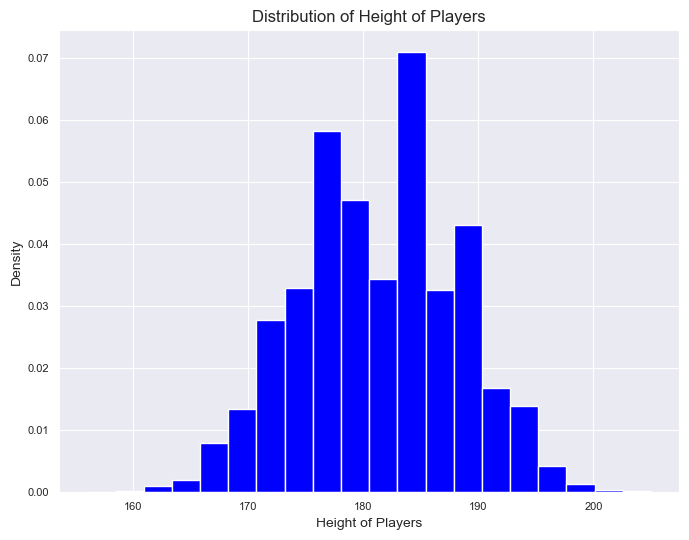

Skewness of height is -0.03819688576323108


In [58]:
# Calculate the histogram and edges
hist, edges = np.histogram(data['height_cm'], density=True, bins=20)

# Create the plot
plt.figure(figsize=(8, 6))
plt.bar(edges[:-1], hist, width=np.diff(edges), align='edge', color='blue', edgecolor='white')

# Set plot labels and title
plt.xlabel('Height of Players')
plt.ylabel('Density')
plt.title('Distribution of Height of Players')

# Show the plot
plt.show()

# Calculate the skewness
skewness = data['height_cm'].skew()
print("Skewness of height is", skewness)

###### The height attribute is quite symmetrical.

###### Maximum players are between 175 and 190 cm.

In [59]:
print("The height of the shortest player is {} cm and his name is {}".format(data['height_cm'].min(),
            list(data.loc[data['height_cm'] == data['height_cm'].min()]['short_name'])[0]))

print("The height of the tallest player is {} cm and his name is {}".format(data['height_cm'].max(),
            list(data.loc[data['height_cm'] == data['height_cm'].max()]['short_name'])[0]))

The height of the shortest player is 156 cm and his name is N. Barrios
The height of the tallest player is 205 cm and his name is T. Holý


#### Weight in kg

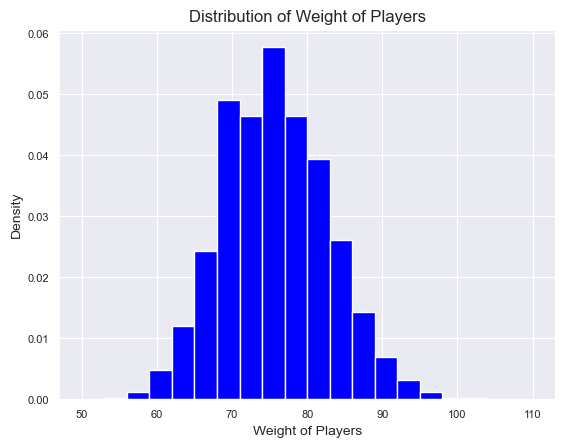

Skewness of weight is 0.22080235007640786


In [60]:
# Calculate histogram and edges using numpy
hist, edges = np.histogram(data['weight_kg'], density=True, bins=20)

# Create a new figure and axis
fig, ax = plt.subplots()

# Plot the histogram as a bar chart
ax.bar(edges[:-1], hist, width=np.diff(edges), align='edge', color='b', edgecolor='w')

# Set labels and title
ax.set_xlabel('Weight of Players')
ax.set_ylabel('Density')
ax.set_title('Distribution of Weight of Players')

# Show the plot
plt.show()

# Calculate and print the skewness
print("Skewness of weight is", data['weight_kg'].skew())


###### Most of the players are in between 70 and 80 KGs of weight.

In [61]:
print("The weight of the lightest player is {} kg and his name is {}".format(data['weight_kg'].min(),
            list(data.loc[data['weight_kg'] == data['weight_kg'].min()]['short_name'])[0]))

print("The weight of the heaviest player is {} kg and his name is {}".format(data['weight_kg'].max(),
            list(data.loc[data['weight_kg'] == data['weight_kg'].max()]['short_name'])[0]))


The weight of the lightest player is 50 kg and his name is B. Al Mutairi
The weight of the heaviest player is 110 kg and his name is A. Akinfenwa


###### Let's see statistics of both of these players

In [62]:
data.loc[data['weight_kg'] == data['weight_kg'].min()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,age_group
13070,235600,https://sofifa.com/player/235600/bandar-al-mut...,B. Al Mutairi,Bandar Al Mutairi,29,1990-03-14,168,50,Saudi Arabia,Al Fayha,...,56,56,56,62,61,56,56,56,61,"(25, 30]"


In [63]:
data.loc[data['weight_kg'] == data['weight_kg'].max()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,age_group
10693,156321,https://sofifa.com/player/156321/adebayo-akinf...,A. Akinfenwa,Adebayo Akinfenwa,37,1982-05-10,178,110,England,Wycombe Wanderers,...,49,49,49,44,43,48,48,48,43,"(35, 40]"


#### Distribution of overall score to visualize range of player performance, identify outliers and help understand the distribution's spread and skewness.

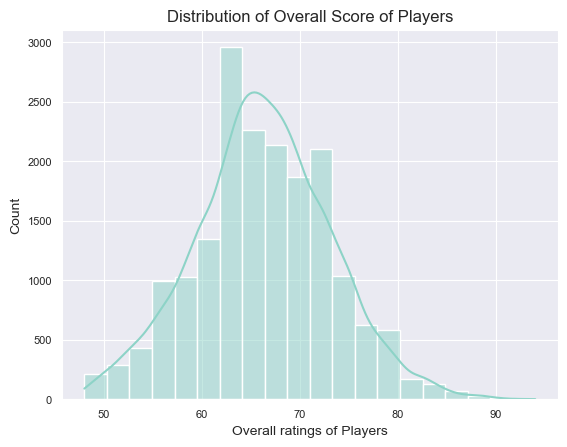

Skewness of overall score is 0.07089343291701235


In [64]:
fig, ax = plt.subplots()

sns.histplot(data['overall'], kde=True, bins=20, ax=ax, edgecolor='white')

ax.set_xlabel('Overall ratings of Players')
ax.set_title('Distribution of Overall Score of Players')

plt.show()


skewness = data['overall'].skew()
print("Skewness of overall score is", skewness)

###### A skewness value of 0.0709 for the overall score distribution indicates a very slight positive skewness.
######  A skewness value close to zero (0.0709) indicates that the overall score distribution in the FIFA dataset is nearly symmetric, with a slight tendency towards higher scores.

#### overall rating

In [65]:
# Find the row with the highest overall rating
highest_rated_player_row = data.loc[data['overall'] == data['overall'].max()]

# Extract the name and overall rating of the highest-rated player
highest_rated_player_name = highest_rated_player_row['short_name'].values[0]
highest_rated_player_rating = highest_rated_player_row['overall'].values[0]
# Print the results
print("The highest rated player is {} and his rating is {}".format(highest_rated_player_name, highest_rated_player_rating))

The highest rated player is L. Messi and his rating is 94


In [66]:
#Lowest Overall Rating
# Find the row with the LOWEST overall rating
lowest_rated_player_row = data.loc[data['overall'] == data['overall'].min()]

# Extract the name and overall rating of the highest-rated player
lowest_rated_player_name = lowest_rated_player_row['short_name'].values[0]
lowest_rated_player_rating = lowest_rated_player_row['overall'].values[0]
# Print the results
print("The lowest rated player is {} and his rating is {}".format(lowest_rated_player_name, lowest_rated_player_rating))

The lowest rated player is Tao Qianglong and his rating is 48


#### Potential

In [67]:
data['potential'].isnull().sum()

0

###### checking the 20 players who have the highest potential.

In [68]:
data.sort_values("potential", axis = 0, ascending = False)[['short_name', 'club', 'overall', 'potential', 'value_eur']].head(20)

,short_name,club,overall,potential,value_eur
10,K. Mbappé,Paris Saint-Germain,89,95,93500000
0,L. Messi,FC Barcelona,94,94,95500000
6,M. ter Stegen,FC Barcelona,90,93,67500000
73,M. de Ligt,Juventus,85,93,50000000
1,Cristiano Ronaldo,Juventus,93,93,58500000
411,João Félix,Atlético Madrid,80,93,28000000
3,J. Oblak,Atlético Madrid,91,93,77500000
74,G. Donnarumma,Milan,85,92,41500000
108,J. Sancho,Borussia Dortmund,84,92,44500000
109,K. Havertz,Bayer 04 Leverkusen,84,92,46000000


###### Let's checkout the player who has the highest and the lowest potential

In [69]:
data.loc[data['potential'] == data['potential'].max()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,age_group
10,231747,https://sofifa.com/player/231747/kylian-mbappe...,K. Mbappé,Kylian Mbappé,20,1998-12-20,178,73,France,Paris Saint-Germain,...,62,62,62,66,63,54,54,54,63,"(0, 20]"


###### K. Mbappe has a potential score of 95 which is amazing, he truely deserves it

In [70]:
data.loc[data['potential'] == data['potential'].min()]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,age_group
18233,182461,https://sofifa.com/player/182461/ting-zhou/20/...,Zhou Ting,周挺,40,1979-02-05,182,73,China PR,Dalian YiFang FC,...,50,50,50,48,48,51,51,51,48,"(35, 40]"
18234,247775,https://sofifa.com/player/247775/junzhe-zhang/...,Zhang Junzhe,张俊哲,28,1991-02-20,183,69,China PR,Hebei China Fortune FC,...,42,42,42,47,48,46,46,46,48,"(25, 30]"


###### We can observe that all the high potential players are highly paid and their overall score is also very high

In [71]:
# Assuming you have imported the dataset1 and the necessary columns ('overall', 'potential', 'value_eur') are present.

# Calculating correlation coefficient of Overall Score and Potential of players
from scipy.stats import pearsonr
# Calculating correlation coefficient of Overall Score and Potential of players
corr, _ = pearsonr(data['overall'], data['potential'])
corr1, _ = pearsonr(data['value_eur'], data['potential'])
print('Pearsons correlation for overall score and potential is %.3f' % corr)
print('Pearsons correlation for value_eur and potential is %.3f' % corr1)

Pearsons correlation for overall score and potential is 0.647
Pearsons correlation for value_eur and potential is 0.581


#### Preferred Foot

In [72]:
data['preferred_foot'].isnull().sum()

0

In [73]:
data['preferred_foot'].value_counts()

preferred_foot
Right    13960
Left      4318
Name: count, dtype: int64

In [74]:
from math import pi
foot = data['preferred_foot'].value_counts().index.to_list()
count = data['preferred_foot'].value_counts().values
count1 = count / sum(count) * 100
angle = count / sum(count) * 2 * pi

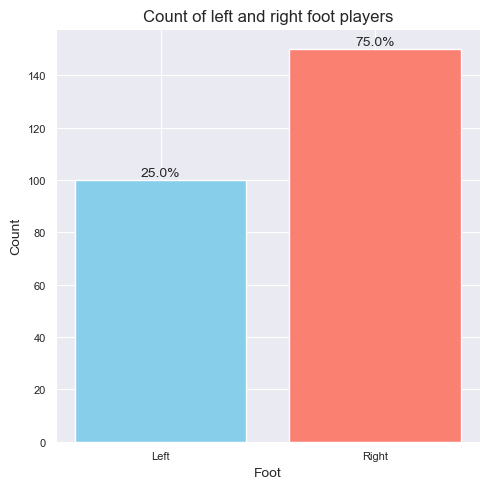

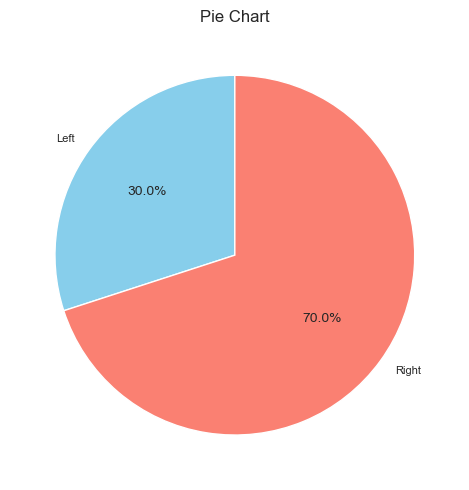

In [75]:
import matplotlib.pyplot as plt

def plot_left_right_foot_counts(foot, count, color, count1):
    # Create a figure and axis object
    fig, ax = plt.subplots(figsize=(5,5))

    # Plot the left and right foot counts using a bar chart
    bars = ax.bar(foot, count, color=color)

    # Add labels for the percentage on top of the bars
    for i, bar in enumerate(bars):
        ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 0.5, f"{count1[i]:.1f}%", ha='center', va='bottom')

    # Set labels and title
    ax.set_xlabel('Foot')
    ax.set_ylabel('Count')
    ax.set_title("Count of left and right foot players")

    # Show the plot
    plt.tight_layout()
def plot_pie_chart(foot, angle, color, percentage):
    # Create a figure and axis object
    fig, ax = plt.subplots(figsize=(5, 5))

    # Plot the pie chart
    ax.pie(angle, labels=foot, colors=color, autopct='%1.1f%%', startangle=90)

    # Set title
    ax.set_title("Pie Chart")

    # Show the plot
    plt.tight_layout()

# Call the functions with the appropriate data
foot = ['Left', 'Right']  # Replace this with the actual foot data
count = [100, 150]  # Replace this with the actual count data
color = ['skyblue', 'salmon']  # Replace this with the actual color data
count1 = [25, 75]  # Replace this with the actual percentage data
plot_left_right_foot_counts(foot, count, color, count1)

angle = [30, 70]  # Replace this with the actual angle data
percentage = [25, 75]  # Replace this with the actual percentage data
plot_pie_chart(foot, angle, color, percentage)

# Show the plots together
plt.show()

#### International_reputation

In [76]:
data['international_reputation'].isnull().sum()

0

In [77]:
data['international_reputation'].value_counts()

international_reputation
1    16794
2     1140
3      292
4       46
5        6
Name: count, dtype: int64

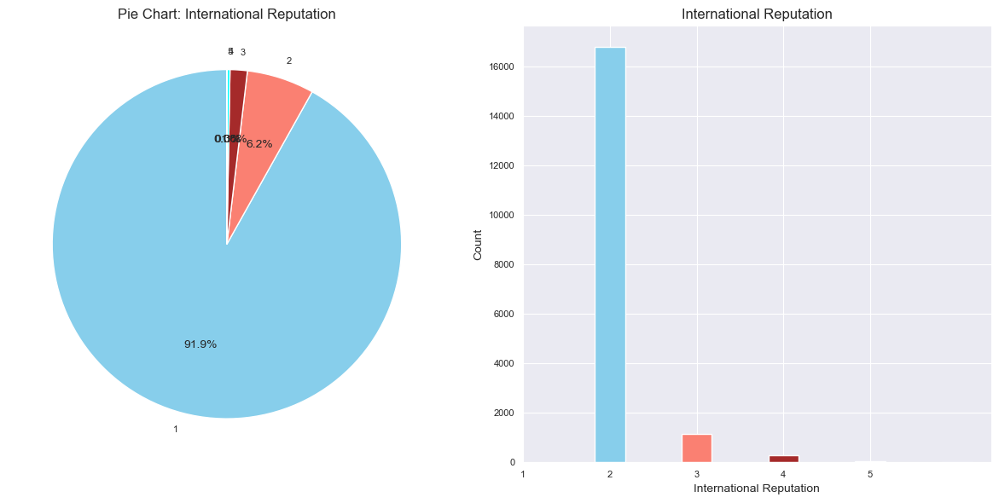

In [78]:
import matplotlib.pyplot as plt

# Assuming you have imported the dataset1 and the necessary columns ('international_reputation') are present.

# Get the counts and percentages of international reputation
reputation = data['international_reputation'].value_counts().index.tolist()
count = data['international_reputation'].value_counts().values
count1 = count / sum(count) * 100
angle = count / sum(count) * 2 * np.pi

# Create a new figure and axis for both charts
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Create the pie chart (p8) in the first subplot (ax1)
ax1.pie(count, labels=reputation, colors=['skyblue', 'salmon', 'brown', 'cyan', 'red'], startangle=90, autopct='%1.1f%%', wedgeprops={'edgecolor': 'white'})
ax1.set_title('Pie Chart: International Reputation')

# Create the vertical bar chart (p9) in the second subplot (ax2)
bar_width = 0.35
ax2.bar(reputation, count, width=bar_width, color=['skyblue', 'salmon', 'brown', 'cyan', 'red'])
ax2.set_xlabel('International Reputation')
ax2.set_ylabel('Count')
ax2.set_title('International Reputation')
ax2.set_xticks(range(len(reputation)))  # Ensure x-axis labels are at the same positions as in the pie chart
ax2.set_xticklabels(reputation, rotation='horizontal')  # Rotate x-axis labels for better visibility

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

#### Skill Moves

In [79]:
data['skill_moves'].isnull().sum()

0

In [80]:
data['skill_moves'].value_counts()

skill_moves
2    8617
3    6536
1    2036
4    1040
5      49
Name: count, dtype: int64

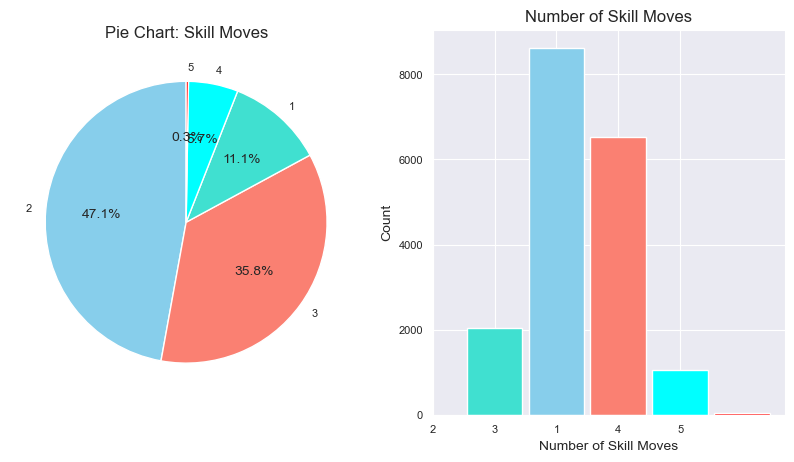

In [81]:
# Assuming you have imported the dataset1 and the necessary columns ('skill_moves') are present.

# Get the counts and percentages of skill moves
no_of_skills = data['skill_moves'].value_counts().index.tolist()
count = data['skill_moves'].value_counts().values
count1 = count / sum(count) * 100
angle = count / sum(count) * 2 * np.pi

# Create the pie chart (p10) using Matplotlib
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Plot the pie chart on the first subplot
ax1.pie(count, labels=no_of_skills, colors=['skyblue', 'salmon', 'turquoise', 'cyan', 'red'], startangle=90, autopct='%1.1f%%', wedgeprops={'edgecolor': 'white'})
ax1.set_title('Pie Chart: Skill Moves')

# Create the vertical bar chart (p11) using Matplotlib
ax2.bar(no_of_skills, count, width=0.9, color=['skyblue', 'salmon', 'turquoise', 'cyan', 'red'])
ax2.set_xlabel('Number of Skill Moves')
ax2.set_ylabel('Count')
ax2.set_title('Number of Skill Moves')

# Rotate x-axis labels for better visibility
ax2.set_xticks(range(len(no_of_skills)))
ax2.set_xticklabels(no_of_skills, rotation='horizontal')

# Show the plot
plt.show()


## Data preprocessing

#### CHECK MISSING VALUE

In [82]:
pd.set_option('display.max_rows',None)
data.isnull().sum()

sofifa_id                         0
player_url                        0
short_name                        0
long_name                         0
age                               0
dob                               0
height_cm                         0
weight_kg                         0
nationality                       0
club                              0
overall                           0
potential                         0
value_eur                         0
wage_eur                          0
player_positions                  0
preferred_foot                    0
international_reputation          0
weak_foot                         0
skill_moves                       0
work_rate                         0
body_type                         0
real_face                         0
release_clause_eur             1298
player_tags                   16779
team_position                   240
team_jersey_number              240
loaned_from                   17230
joined                      

In [83]:
# Create function to check missing value with percentage
def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum() / data.isnull().count() * 100)
    null_value = pd.concat([null_value, percentage], axis=1, keys=['Missing Number', 'Missing Percentage'])
    # Differentiate between numerical and categorical columns
    numerical_cols = data.select_dtypes(include=['int', 'float']).columns
    categorical_cols = data.select_dtypes(include=['object']).columns
    null_value['Data Type'] = 'Numerical'
    null_value.loc[categorical_cols, 'Data Type'] = 'Categorical'
# Convert percentages to strings for better display
    null_value['Missing Percentage'] = null_value['Missing Percentage'].apply(lambda x: str(round(x, 2)) + "%")

    return null_value[['Missing Number', 'Missing Percentage', 'Data Type']]
# Assuming you have 'data' as your DataFrame
missing_info = missing_value(data)
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(missing_info)

                            Missing Number Missing Percentage    Data Type
sofifa_id                                0               0.0%    Numerical
player_url                               0               0.0%  Categorical
short_name                               0               0.0%  Categorical
long_name                                0               0.0%  Categorical
age                                      0               0.0%    Numerical
dob                                      0               0.0%  Categorical
height_cm                                0               0.0%    Numerical
weight_kg                                0               0.0%    Numerical
nationality                              0               0.0%  Categorical
club                                     0               0.0%  Categorical
overall                                  0               0.0%    Numerical
potential                                0               0.0%    Numerical
value_eur                

#### Check missing value and it's percentage

In [84]:
def missing_value(data):
    null_value = data.isnull().sum()
    percentage = (data.isnull().sum()/data.isnull().count()*100)
    null_value = pd.concat([null_value,percentage],axis=1,keys=['Missing Number','Missing Percentage'])
    return null_value
missing_value(data)

,Missing Number,Missing Percentage
sofifa_id,0,0.000000
player_url,0,0.000000
short_name,0,0.000000
long_name,0,0.000000
age,0,0.000000
dob,0,0.000000
height_cm,0,0.000000
weight_kg,0,0.000000
nationality,0,0.000000
club,0,0.000000


#### Impute missing value

We drop 11 features that have a high percentage of missing values (50-90%). Additionally, we remove unique features that contain missing values. For the remaining features, which have less than 15% missing values, we impute the missing values.

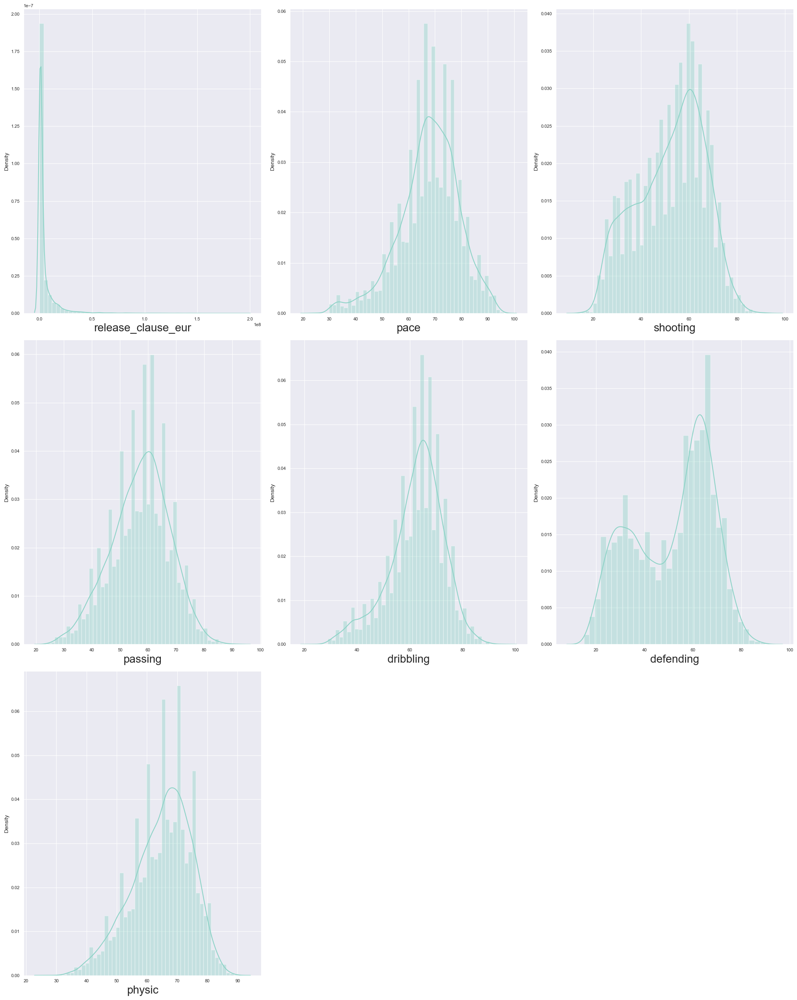

In [85]:
dist = data[['release_clause_eur','pace','shooting','passing','dribbling','defending','physic']]

plt.figure(figsize=(20,25)) # defining canvas size
plotno = 1 

for column in dist:
    if plotno<=8: 
        plt.subplot(3,3,plotno) 
        sns.distplot(x=dist[column])  
        plt.xlabel(column,fontsize=20) 
    plotno+=1 
plt.tight_layout()
plt.show()

###### The distribution plots reveal that 'release_clause_eur' has a highly skewed distribution, indicating a large range of values. In contrast, the other attributes ('pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic') have relatively normal distributions, suggesting a more even spread of values

In [86]:
data.loc[data['release_clause_eur'].isnull()==True,'release_clause_eur']=data['release_clause_eur'].median()
data.loc[data['pace'].isnull()==True,'pace']=data['pace'].median()
data.loc[data['shooting'].isnull()==True,'shooting']=data['shooting'].median()
data.loc[data['passing'].isnull()==True,'passing']=data['passing'].median()
data.loc[data['dribbling'].isnull()==True,'dribbling']=data['dribbling'].median()
data.loc[data['defending'].isnull()==True,'defending']=data['defending'].median()
data.loc[data['physic'].isnull()==True,'physic']=data['physic'].median()

###### Missing values in the numerical features ('release_clause_eur', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic') have been imputed with their respective median values, ensuring that the data is now complete and ready for further analysis.

In [87]:
print('release_clause_eur:',data['release_clause_eur'].isnull().sum())
print('pace:',data['pace'].isnull().sum())
print('shooting:',data['shooting'].isnull().sum())
print('passing:',data['passing'].isnull().sum())
print('dribbling:',data['dribbling'].isnull().sum())
print('defending:',data['defending'].isnull().sum())
print('physic:',data['physic'].isnull().sum())

release_clause_eur: 0
pace: 0
shooting: 0
passing: 0
dribbling: 0
defending: 0
physic: 0


###### After imputing missing values with median values, the output confirms that there are no missing values left in the numerical features ('release_clause_eur', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic'), indicating a successful imputation process.

In [88]:
data.team_position.value_counts().head()

team_position
SUB    7820
RES    2958
GK      662
RCB     660
LCB     660
Name: count, dtype: int64

###### The value_counts() method for the 'team_position' feature shows the most common positions in the dataset. It appears that the positions with the highest frequency are SUB (substitutes), RES (reserves), GK (goalkeepers), RCB (right center backs), and LCB (left center backs). This information can be useful to understand the distribution of players across different positions in the dataset.

In [89]:
data['team_position'] = data['team_position'].replace(np.nan,'SUB')

###### The code replaces all missing values (NaN) in the 'team_position' feature with 'SUB', which stands for substitutes. This implies that any players with unknown or missing team positions are now assumed to be substitutes. This replacement may be based on the assumption that substitutes are the most common or representative position in the dataset, as seen in the previous value_counts() output.

In [90]:
data['team_position'].isnull().sum()

0

###### Handling categorical data

In [91]:
data.preferred_foot.value_counts()

preferred_foot
Right    13960
Left      4318
Name: count, dtype: int64

In [92]:
data.preferred_foot = data.preferred_foot.map({'Right':1,'Left':0})

###### The code maps the 'preferred_foot' feature, assigning 1 to 'Right' because it is the majority and most frequent, and 0 to 'Left' because it is less common.

In [93]:
data.team_position.value_counts()

team_position
SUB    8060
RES    2958
GK      662
RCB     660
LCB     660
RB      560
LB      560
ST      458
RCM     411
LCM     411
RM      399
LM      398
CAM     311
RDM     244
LDM     242
RS      195
LS      195
CDM     181
LW      162
RW      161
CB      100
CM       76
RWB      58
LWB      58
RAM      23
LAM      23
RF       19
LF       19
CF       14
Name: count, dtype: int64

In [94]:
data.team_position = data.team_position.map({'SUB':28,'RES':27,'GK':26,'RCB':25,'LCB':24,'RB':23,'LB':22,'ST':21,
                                            'RCM':20,'LCM':19,'RM':18,'LM':17,'CAM':16,'RDM':15,'LDM':14,'RS':13,
                                            'LS':12,'CDM':11,'LW':10,'RW':9,'CB':8,'CM':7,'RWB':6,'LWB':5,'RAM':4,
                                            'LAM':3,'RF':2,'LF':1,'CF':0})

###### The code maps each unique value in the 'team_position' feature to a specific integer, creating a numerical representation for each position. This could be useful for certain types of analysis, such as machine learning algorithms that require numerical input. The values are assigned based on the frequency of each position in the dataset, with more common positions receiving lower integer values.

In [95]:
data.team_position.unique()

array([ 9, 10, 16, 26, 20, 24, 21, 11, 14, 18, 25, 19, 17,  0, 28, 22, 12,
       23, 15, 27,  4, 13,  2,  7,  8,  1,  3,  6,  5], dtype=int64)

#### Handling outlier

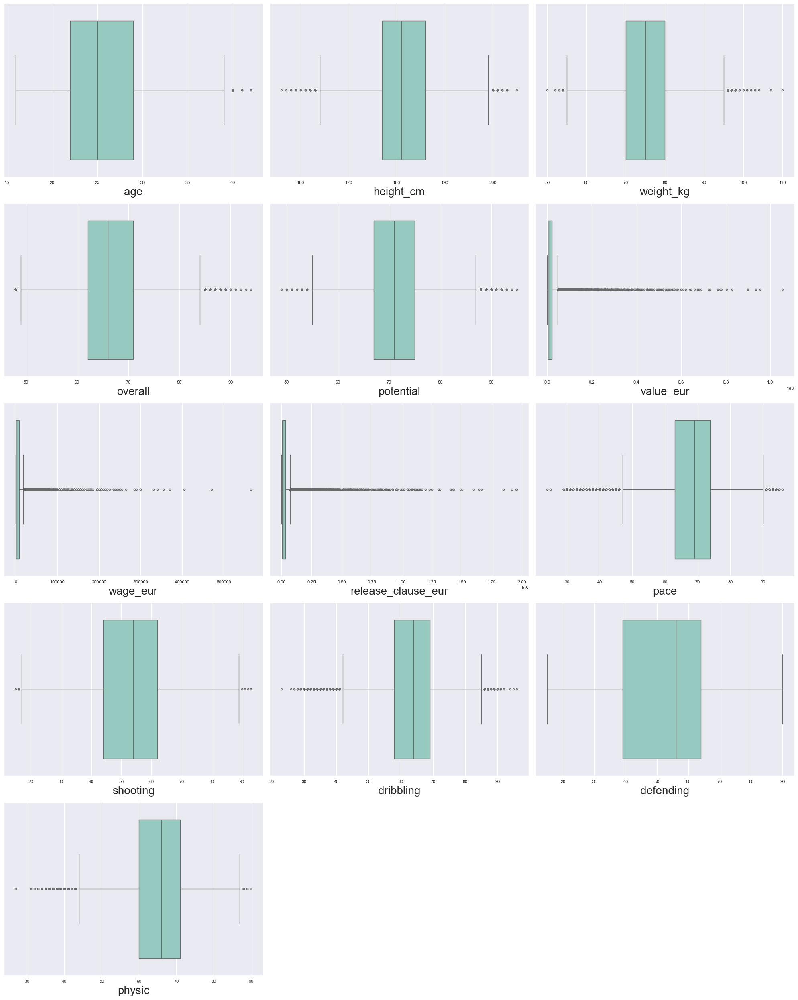

In [96]:
out = data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur','pace',
           'shooting','dribbling','defending','physic']]

plt.figure(figsize=(20,25)) 
plotno = 1

for column in out: 
    if plotno<=16:    
        plt.subplot(5,3,plotno)
        sns.boxplot(x=out[column]) 
        plt.xlabel(column,fontsize=20)  
    plotno+=1 
plt.tight_layout()
plt.show() 

###### The code selects 13 columns from a dataframe, likely containing football player data, and creates a figure with 16 box plots to visualize the distribution of values in each column. The box plots provide insights into central tendency, variability, and outliers in the data. This can help identify patterns, correlations, or anomalies in player attributes and market values.

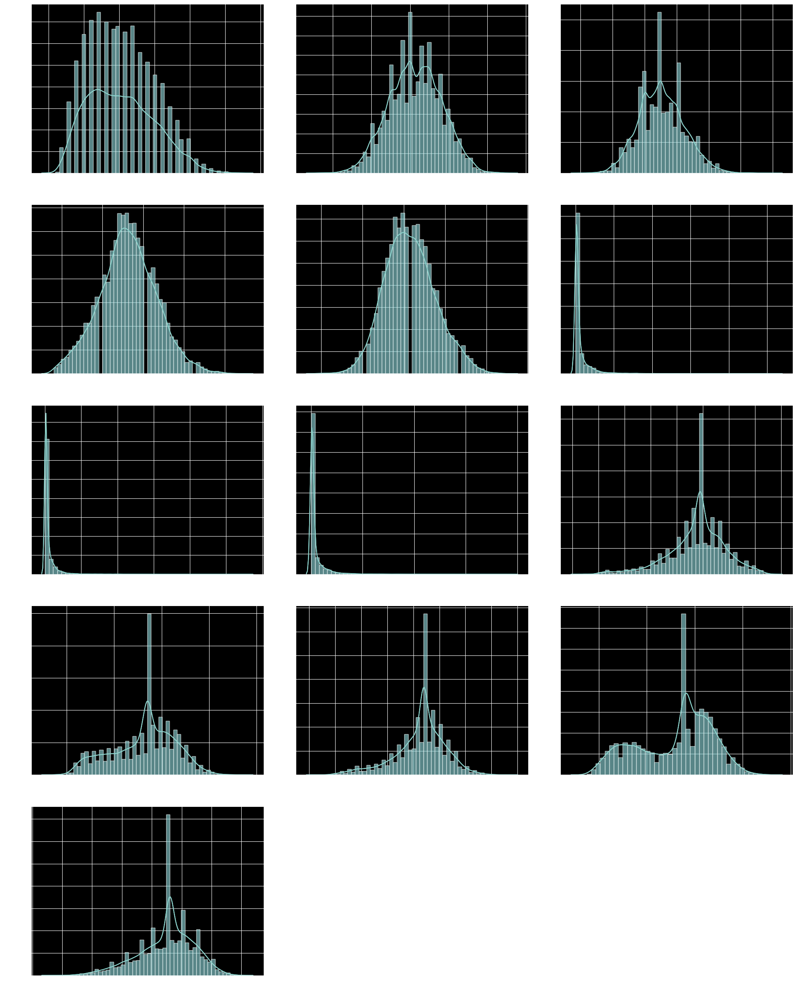

In [97]:
dist1 = data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur','pace',
           'shooting','dribbling','defending','physic']]

plt.figure(figsize=(20,25)) 
plt.style.use('dark_background')
plotno = 1 

for column in dist1:
    if plotno<=15:
        plt.subplot(5,3,plotno)
        sns.distplot(x=dist1[column], color='skyblue')
        # You might want to plot the distribution of the same column in dist1
        # If you want to compare with another distribution, replace dist1 with that DataFrame
        sns.distplot(x=dist1[column])
        plt.xlabel(column,fontsize=20)
    plotno+=1
plt.tight_layout()
plt.show()

###### The code creates a figure with 15 density plots to visualize the distribution of values in each column of the selected football player data. The density plots provide insights into the shape, central tendency, and variability of the data, helping to identify patterns, correlations, or anomalies in player attributes and market values.

#### Empherical rule or 3 standard deviation rule to detect the outlier

#### AGE

In [98]:
upper_limit = data.age.mean() + 3*data.age.std()
print("Upper limit:",upper_limit)
lower_limit = data.age.mean() - 3*data.age.std()
print("Lower limit:",lower_limit)

Upper limit: 39.25418488202056
Lower limit: 11.312397895088532


###### The code calculates age limits for outlier detection using the mean and 3x standard deviation method. Any player with an age outside these limits would be considered an outlier.

In [99]:
len(data.loc[data['age'] > upper_limit])/18278*100

0.10395010395010396

###### The code calculates the percentage of football players in the dataset who are older than a certain upper_limit age. The result, approximately 10.4%, indicates that about 10.4% of the players in the dataset are above the specified age threshold.

In [100]:
data.loc[data['age'] > upper_limit,'age']=data['age'].mean()

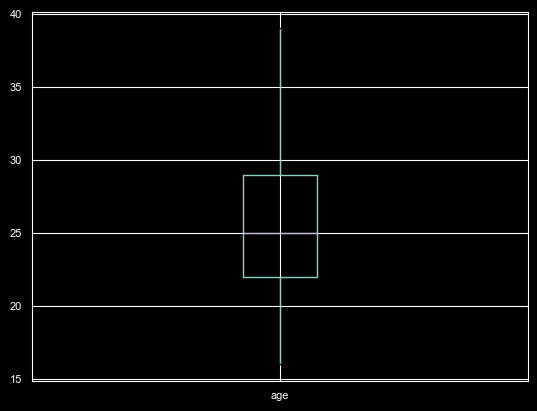

In [101]:
data.boxplot('age')
plt.show()

#### HEIGHT CM

In [102]:
upper_limit = data.height_cm.mean() + 3*data.height_cm.std()
print("Upper limit:",upper_limit)
lower_limit = data.height_cm.mean() - 3*data.height_cm.std()
print("Lower limit:",lower_limit)

Upper limit: 201.6330681374958
Lower limit: 161.09129995529332


###### The code calculates height limits for outlier detection using the mean and 3x standard deviation method. Any player with a height outside these limits would be considered an outlier.

In [103]:
len(data.loc[data['height_cm'] > upper_limit])/18278*100

0.06018163912900754

###### The code calculates the percentage of players with heights above the upper limit.

In [104]:
data.loc[data['height_cm'] <  lower_limit,'height_cm'] = data['height_cm'].mean()
data.loc[data['height_cm'] > upper_limit,'height_cm'] = data['height_cm'].mean()

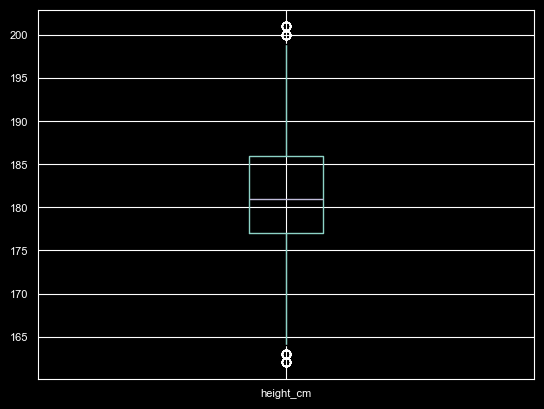

In [105]:
data.boxplot('height_cm')
plt.show()

###### Weight kg

In [106]:
upper_limit = data.weight_kg.mean() + 3*data.weight_kg.std()
print("Upper limit:",upper_limit)
lower_limit = data.weight_kg.mean() - 3*data.weight_kg.std()
print("Lower limit:",lower_limit)

Upper limit: 96.41957385582987
Lower limit: 54.13311243369853


In [107]:
len(data.loc[data['weight_kg'] < lower_limit])/18278*100

0.06018163912900754

In [108]:
len(data.loc[data['weight_kg'] > upper_limit])/18278*100

0.22431338220811906

In [109]:
data.loc[data['weight_kg'] < lower_limit,'weight_kg']=data['weight_kg'].mean()
data.loc[data['weight_kg'] > upper_limit,'weight_kg']=data['weight_kg'].mean()

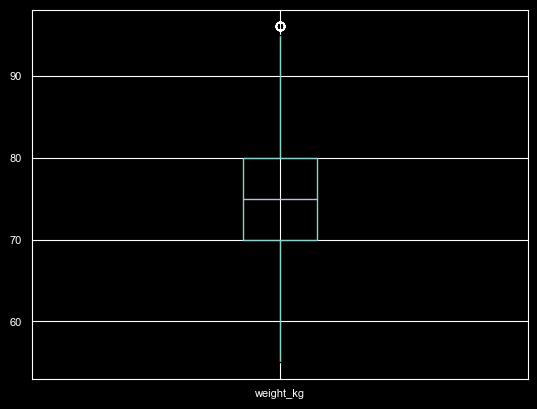

In [110]:
data.boxplot('weight_kg')
plt.show()

#### Overall

In [111]:
upper_limit = data.overall.mean() + 3*data.overall.std()
print("Upper limit:",upper_limit)
lower_limit = data.overall.mean() - 3*data.overall.std()
print("Lower limit:",lower_limit)

Upper limit: 87.09485374672605
Lower limit: 45.395134216946126


In [112]:
data.loc[data['overall'] < lower_limit]

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,age_group


In [113]:
len(data.loc[data['overall'] > upper_limit])/18278*100

0.218842324105482

In [114]:
data.loc[data['overall'] > upper_limit, 'overall'] = data['overall'].mean()

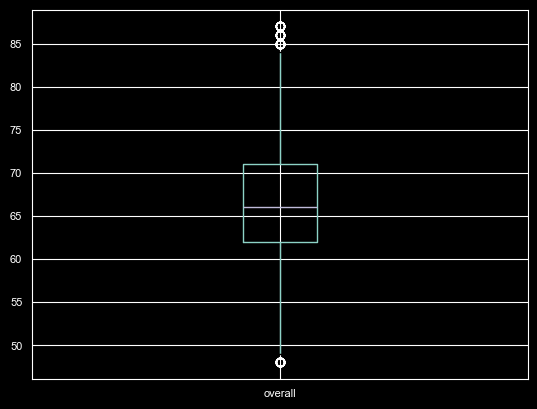

In [115]:
data.boxplot('overall')
plt.show()

#### Potential

In [116]:
upper_limit = data.potential.mean() + 3*data.potential.std()
print("Upper limit:",upper_limit)
lower_limit = data.potential.mean() - 3*data.potential.std()
print("Lower limit:",lower_limit)

Upper limit: 89.96589419280835
Lower limit: 53.12787974307086


In [117]:
len(data.loc[data['potential'] < lower_limit])/18278*100

0.09300798774482985

In [118]:
len(data.loc[data['potential'] > upper_limit])/18278*100

0.21337126600284498

In [119]:
data.loc[data['potential'] < lower_limit,'potential']=data['potential'].mean()
data.loc[data['potential'] > upper_limit,'potential']=data['potential'].mean()

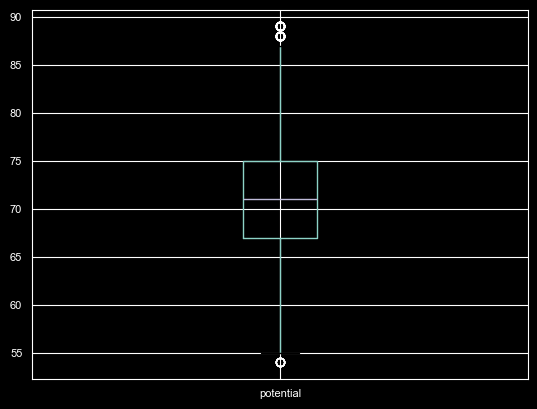

In [120]:
data.boxplot('potential')
plt.show()

#### Inret Quatiel Range (IQR)

In [121]:
from scipy import stats
iqr = stats.iqr(data['value_eur'],interpolation='midpoint')
print("IQR",iqr)


Q1 = data['value_eur'].quantile(0.25) 
Q3 = data['value_eur'].quantile(0.75) 

min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)


IQR 1775000.0
minimum limit -2337500.0
maximum limit 4762500.0


In [122]:
len(data.loc[data['value_eur'] > max_limit])/18278*100

13.737826895721634

###### The code calculates the percentage of players with values above a certain max limit. If the percentage of outliers is more than 5%, it decides not to impute (replace) these outliers.

#### Wage eur

In [123]:
from scipy import stats
iqr = stats.iqr(data['wage_eur'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['wage_eur'].quantile(0.25)
Q3 = data['wage_eur'].quantile(0.75)

min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)

max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

IQR 7000.0
minimum limit -9500.0
maximum limit 18500.0


In [124]:
len(data.loc[data['wage_eur'] > max_limit])/18278*100

12.911697122223437

###### The code calculates the percentage of players with wages above a certain max limit, which is approximately 12.91%.

#### Release Clasuse Eur

In [125]:
from scipy import stats
iqr = stats.iqr(data['release_clause_eur'],interpolation='midpoint')
print("IQR",iqr)


Q1 = data['release_clause_eur'].quantile(0.25) 
Q3 = data['release_clause_eur'].quantile(0.75) 

min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

IQR 2604000.0
minimum limit -3310000.0
maximum limit 7106000.0


In [126]:
len(data.loc[data['release_clause_eur'] > max_limit])/18278*100

15.368202210307475

###### The code calculates the percentage of players with release clauses above a certain max limit, which is approximately 15.37%.

#### Pace

In [127]:
from scipy import stats
iqr = stats.iqr(data['pace'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['pace'].quantile(0.25)   
Q3 = data['pace'].quantile(0.75)  
# getting max & min limit
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

IQR 11.0
minimum limit 46.5
maximum limit 90.5


In [128]:
len(data.loc[data['pace'] < min_limit])/18278*100

4.19083050661998

In [129]:
len(data.loc[data['pace'] > max_limit])/18278*100

1.0285589232957655

In [130]:
data.loc[data['pace'] < min_limit,'pace'] = data['pace'].median()
data.loc[data['pace'] > max_limit,'pace'] = data['pace'].median()

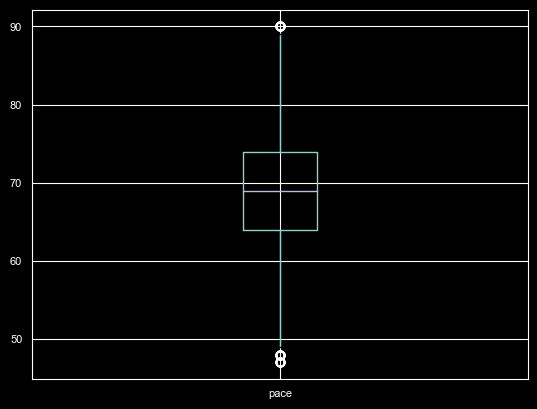

In [131]:
data.boxplot('pace')
plt.show()

#### Shooting

In [132]:
iqr = stats.iqr(data['shooting'],interpolation='midpoint')
print("IQR",iqr)


Q1 = data['shooting'].quantile(0.25) 
Q3 = data['shooting'].quantile(0.75) 

min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

IQR 18.0
minimum limit 17.0
maximum limit 89.0


In [133]:
len(data.loc[data['shooting'] < min_limit])/18278*100

0.02735529051318525

In [134]:
len(data.loc[data['shooting'] > max_limit])/18278*100

0.0218842324105482

In [135]:
data.loc[data['shooting'] < min_limit,'shooting'] = data['shooting'].median()
data.loc[data['shooting'] > max_limit,'shooting'] = data['shooting'].median()

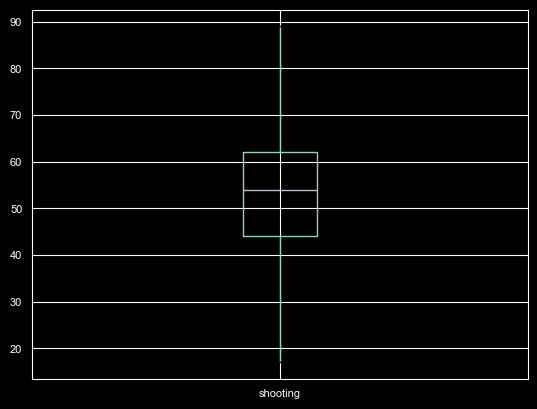

In [136]:
data.boxplot('shooting')
plt.show()

#### Dribbling

In [137]:
iqr = stats.iqr(data['dribbling'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['dribbling'].quantile(0.25)   
Q3 = data['dribbling'].quantile(0.75)  
 
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

IQR 11.0
minimum limit 41.5
maximum limit 85.5


In [138]:
len(data.loc[data['shooting'] < min_limit])/18278*100

21.80763759711128

###### The code calculates the percentage of players with shooting ratings below a certain min limit, which is approximately 21.81%.

In [139]:
len(data.loc[data['shooting'] > max_limit])/18278*100

0.0656526972316446

In [140]:
data.loc[data['dribbling'] > max_limit,'dribbling']=data['dribbling'].median()

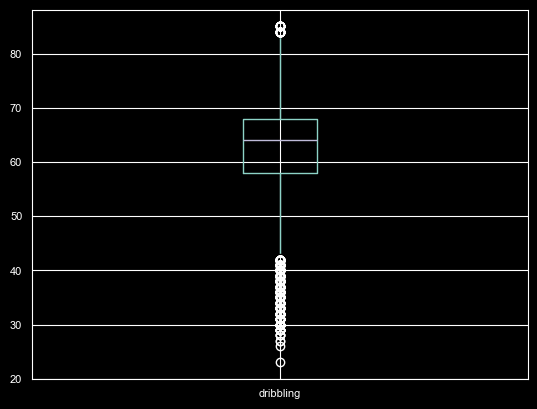

In [141]:
data.boxplot('dribbling')
plt.show()

#### Physic

In [142]:
iqr = stats.iqr(data['physic'],interpolation='midpoint')
print("IQR",iqr)

# step:2
Q1 = data['physic'].quantile(0.25)   
Q3 = data['physic'].quantile(0.75)   
 
min_limit = Q1 - 1.5*iqr
print('minimum limit',min_limit)
max_limit = Q3 + 1.5*iqr
print('maximum limit',max_limit)

IQR 11.0
minimum limit 43.5
maximum limit 87.5


In [143]:
len(data.loc[data['physic'] < min_limit])/18278*100

2.303315461210198

In [144]:
len(data.loc[data['physic'] > max_limit])/18278*100

0.0656526972316446

In [145]:
data.loc[data['physic'] < min_limit,'physic']=data['physic'].median()
data.loc[data['physic'] > max_limit,'physic']=data['physic'].median()

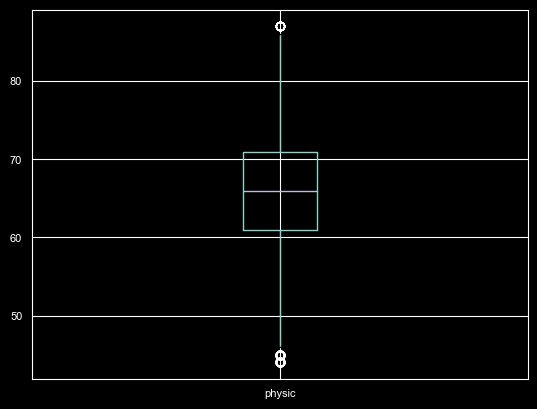

In [146]:
data.boxplot('physic')
plt.show()

#### Checking distribution after impute outlier

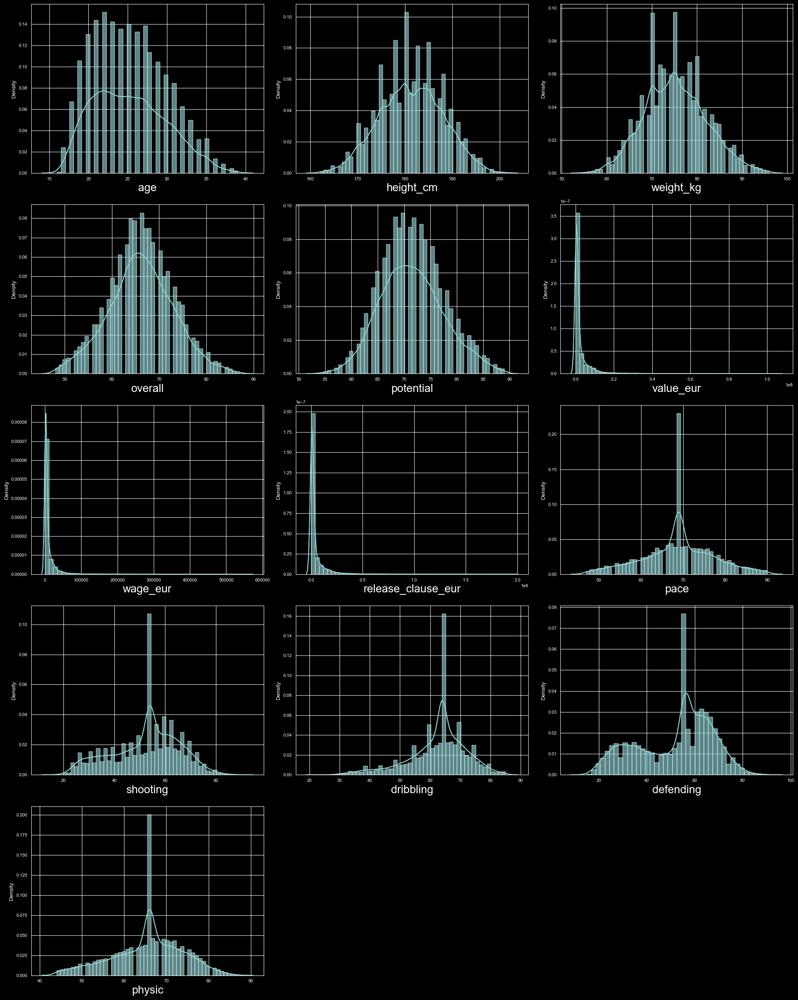

In [147]:
dist2 = data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur','pace',
           'shooting','dribbling','defending','physic']]

plt.style.use('dark_background')

plt.figure(figsize=(20,25)) 
plotno = 1 # counter

for column in dist2: 
    if plotno<=15:   
        plt.subplot(5,3,plotno) 
        sns.distplot(x=dist2[column], color='skyblue')
        sns.distplot(x=dist2[column]) 
        plt.xlabel(column,fontsize=20)  
    plotno+=1 
plt.tight_layout()
plt.show()

###### The code creates a subset of the data (dist2) with 12 specific columns, then uses a loop to create 15 separate subplots, each displaying the distribution of values for a specific column using seaborn's distplot function.

## SCALING

- MIN-MAX SCALING Scales the feature between 0 to 1. Only scales continuous features. Use min-max scaling because the dataset contains a large amount of outliers, so outliers are not going to be biased.

In [148]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler() # Object Creation
data[['age','height_cm','weight_kg','overall','potential','value_eur','wage_eur','release_clause_eur',
    'pace','shooting','passing','dribbling','defending','physic','attacking_crossing','attacking_crossing',
    'attacking_finishing','attacking_heading_accuracy','attacking_short_passing','attacking_volleys',
    'skill_dribbling','skill_curve','skill_fk_accuracy','skill_fk_accuracy','skill_long_passing',
    'skill_ball_control','skill_ball_control','movement_acceleration','movement_sprint_speed',
    'movement_agility','movement_reactions','movement_balance','power_shot_power','power_jumping',
    'power_stamina','power_strength','power_long_shots','mentality_aggression','mentality_interceptions',
    'mentality_positioning','mentality_vision','mentality_penalties','mentality_composure','defending_marking',
    'defending_standing_tackle','defending_sliding_tackle','goalkeeping_diving','goalkeeping_handling',
    'goalkeeping_kicking','goalkeeping_positioning',
    'goalkeeping_reflexes']]=scaler.fit_transform(data[['age','height_cm','weight_kg','overall','potential',
                'value_eur','wage_eur','release_clause_eur','pace','shooting','passing','dribbling','defending',
                'physic','attacking_crossing','attacking_crossing','attacking_finishing','attacking_heading_accuracy',
                'attacking_short_passing','attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy',
                'skill_fk_accuracy','skill_long_passing','skill_ball_control','skill_ball_control','movement_acceleration',
                'movement_sprint_speed','movement_agility','movement_reactions','movement_balance',
                'power_shot_power','power_jumping','power_stamina','power_strength','power_long_shots','mentality_aggression',
                'mentality_interceptions','mentality_positioning','mentality_vision','mentality_penalties',
                'mentality_composure','defending_marking','defending_standing_tackle','defending_sliding_tackle',
                'goalkeeping_diving','goalkeeping_handling','goalkeeping_kicking','goalkeeping_positioning','goalkeeping_reflexes']])

###### The code scales the values of 37 specific columns in the data using the MinMaxScaler from scikit-learn, transforming them to a common range (typically between 0 and 1) to prevent features with large ranges from dominating the model.

In [149]:
data.head(3)

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,age_group
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,0.695652,1987-06-24,0.205128,0.414634,Argentina,FC Barcelona,...,66,66,66,68,63,52,52,52,63,"(30, 35]"
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,0.782609,1985-02-05,0.641026,0.682927,Portugal,Juventus,...,61,61,61,65,61,53,53,53,61,"(30, 35]"
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,0.478261,1992-02-05,0.333333,0.317073,Brazil,Paris Saint-Germain,...,61,61,61,66,61,46,46,46,61,"(25, 30]"


## Feature selection

#### Drop unique and constant features

Here, we are going to drop unique columns as well as columns with lots of missing values. The columns 'ls', 'st', 'rs', 'lw', 'cf', etc. represent playing positions in the game, and the data in these columns is basically the potential of the player if they were to play in that position. So, we assume the player only plays with their team position, and we will drop these columns.

In [150]:
# Drop column
data.drop(['sofifa_id','player_url','short_name','long_name','dob','nationality','club','player_positions','body_type',
          'real_face','player_tags','team_jersey_number','loaned_from','joined','contract_valid_until','nation_position',
          'nation_jersey_number','gk_diving','gk_handling','gk_kicking','gk_reflexes','gk_speed','gk_positioning',
          'player_traits','ls','st','rs','lw','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm',
          'cdm','rdm','rwb','lb','lcb','cb','rcb','rb','lf','work_rate','age_group'],axis=1,inplace=True)

In [151]:
data.head()

,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,preferred_foot,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,0.695652,0.205128,0.414634,0.46782,0.501872,0.905213,1.000000,0,5,4,...,0.800000,1.000000,0.344086,0.367816,0.264368,0.056180,0.109890,0.152174,0.144444,0.076923
1,0.782609,0.641026,0.682927,0.46782,0.501872,0.554502,0.716814,1,5,4,...,0.917647,0.988095,0.290323,0.310345,0.241379,0.067416,0.109890,0.152174,0.144444,0.109890
2,0.478261,0.333333,0.317073,0.46782,0.501872,1.000000,0.513274,1,5,5,...,0.976471,0.976190,0.279570,0.241379,0.298851,0.089888,0.087912,0.152174,0.155556,0.109890
3,0.434783,0.666667,0.780488,0.46782,0.501872,0.734597,0.221239,1,3,3,...,0.047059,0.666667,0.279570,0.080460,0.172414,0.966292,1.000000,0.836957,0.988889,0.967033
4,0.521739,0.333333,0.463415,0.46782,0.501872,0.853081,0.831858,1,4,4,...,0.952941,0.940476,0.354839,0.252874,0.218391,0.112360,0.120879,0.054348,0.077778,0.076923


In [152]:
print(data.columns.tolist())

['age', 'height_cm', 'weight_kg', 'overall', 'potential', 'value_eur', 'wage_eur', 'preferred_foot', 'international_reputation', 'weak_foot', 'skill_moves', 'release_clause_eur', 'team_position', 'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic', 'attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 'attacking_short_passing', 'attacking_volleys', 'skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 'skill_long_passing', 'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed', 'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions', 'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking', 'defending_standing_tackle', 'defending_sliding_tackle', 'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking', 'goalkeeping_positioni

#### Checking correlation

In [153]:
data.corr

<bound method DataFrame.corr of             age  height_cm  weight_kg   overall  potential  value_eur  \
0      0.695652   0.205128   0.414634  0.467820   0.501872   0.905213   
1      0.782609   0.641026   0.682927  0.467820   0.501872   0.554502   
2      0.478261   0.333333   0.317073  0.467820   0.501872   1.000000   
3      0.434783   0.666667   0.780488  0.467820   0.501872   0.734597   
4      0.521739   0.333333   0.463415  0.467820   0.501872   0.853081   
5      0.521739   0.487179   0.365854  0.467820   0.501872   0.853081   
6      0.478261   0.641026   0.731707  0.467820   0.501872   0.639810   
7      0.478261   0.794872   0.902439  0.467820   0.501872   0.739336   
8      0.739130   0.256410   0.268293  0.467820   0.501872   0.426540   
9      0.478261   0.333333   0.390244  0.467820   0.501872   0.763033   
10     0.173913   0.410256   0.439024  0.467820   0.501872   0.886256   
11     0.521739   0.641026   0.829268  0.467820   0.501872   0.639810   
12     0.391304   0

###### This code calculates the pairwise correlation of all columns in the dataset, providing insights into the relationships between features. It helps identify highly correlated features, which can inform feature selection and engineering decisions.

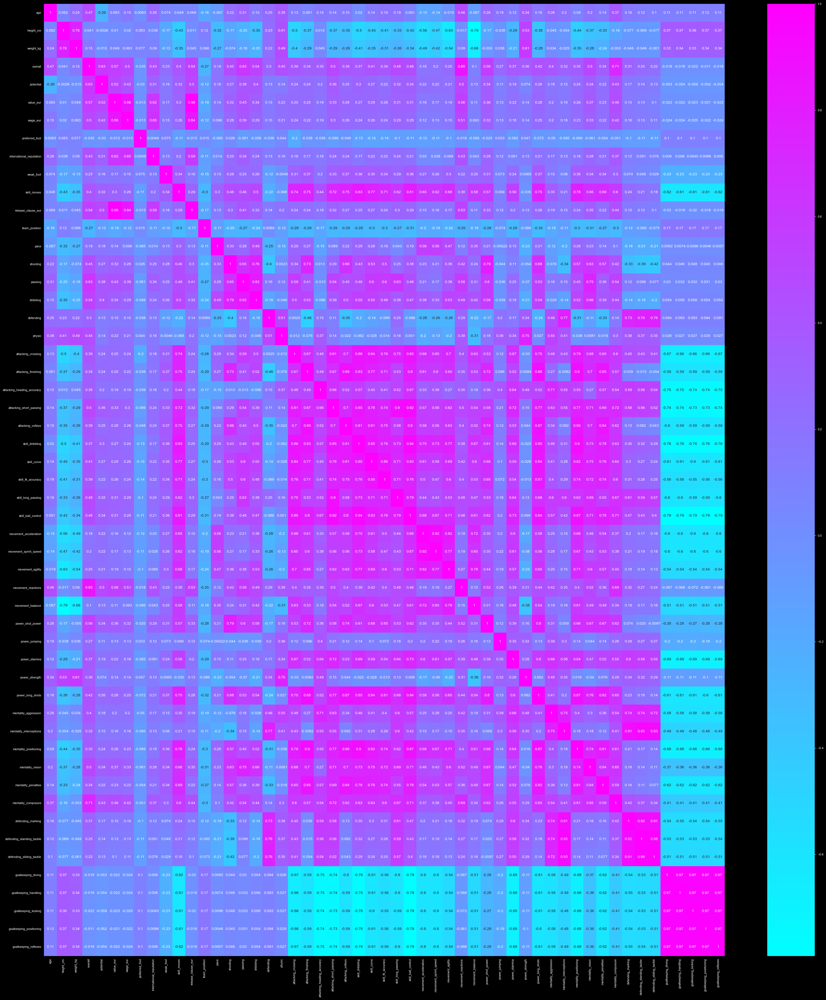

In [154]:
plt.figure(figsize=(40,45))
sns.heatmap(data.corr(),annot=True,cmap='cool')
plt.show()

###### This code generates a heatmap to visualize the correlation matrix of the dataset, providing a clear representation of the relationships between features. The heatmap helps identify patterns, correlations, and outliers in the data.

In [155]:
pd.set_option('display.max_rows',None)
corrmat = data.corr()
corrmat = corrmat.abs().unstack()
corrmat = corrmat.sort_values(ascending=False)
corrmat = corrmat [corrmat >= 0.9] # Set threshold 0.9
corrmat = corrmat [corrmat < 1]
corrmat = pd.DataFrame(corrmat).reset_index()
corrmat.columns = ['feature1','feature2','corr']
corrmat

,feature1,feature2,corr
0,release_clause_eur,value_eur,0.979233
1,value_eur,release_clause_eur,0.979233
2,defending_sliding_tackle,defending_standing_tackle,0.975808
3,defending_standing_tackle,defending_sliding_tackle,0.975808
4,goalkeeping_diving,goalkeeping_reflexes,0.973922
5,goalkeeping_reflexes,goalkeeping_diving,0.973922
6,goalkeeping_handling,goalkeeping_diving,0.971330
7,goalkeeping_diving,goalkeeping_handling,0.971330
8,goalkeeping_reflexes,goalkeeping_handling,0.971244
9,goalkeeping_handling,goalkeeping_reflexes,0.971244


###### This code identifies highly correlated feature pairs in the dataset by calculating the absolute correlation, sorting, and filtering by a threshold (0.9). The resulting dataframe shows feature pairs with correlations above 0.9 and below 1, helping to detect multicollinearity and inform feature selection.

#### Drop highly correlated feature

In [156]:
data.drop(['release_clause_eur','defending_standing_tackle','goalkeeping_diving','goalkeeping_handling',
           'goalkeeping_positioning','goalkeeping_reflexes','mentality_interceptions','skill_ball_control',
           'movement_sprint_speed','defending_marking','mentality_positioning','attacking_short_passing'],axis=1,inplace=True)

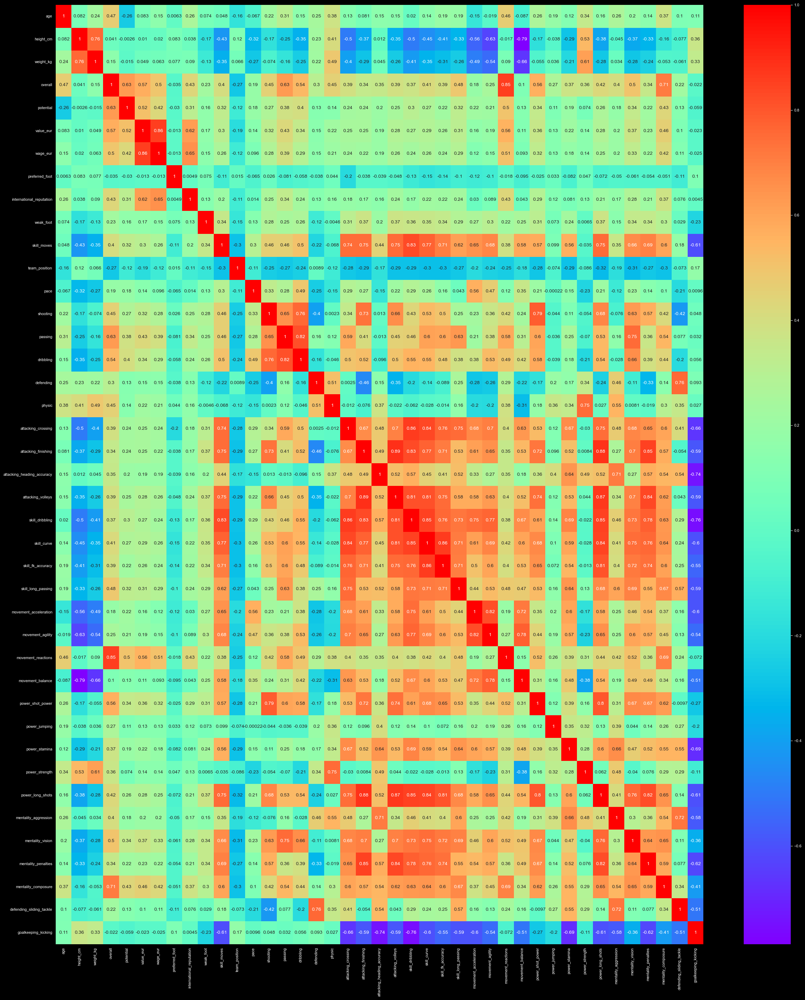

In [157]:
plt.figure(figsize=(30,35))
sns.heatmap(data.corr(),annot=True,cmap='rainbow')
plt.show()

#### Checking duplicates

In [158]:
data.duplicated().sum()

0

## Principle Component Analysis(PCA)

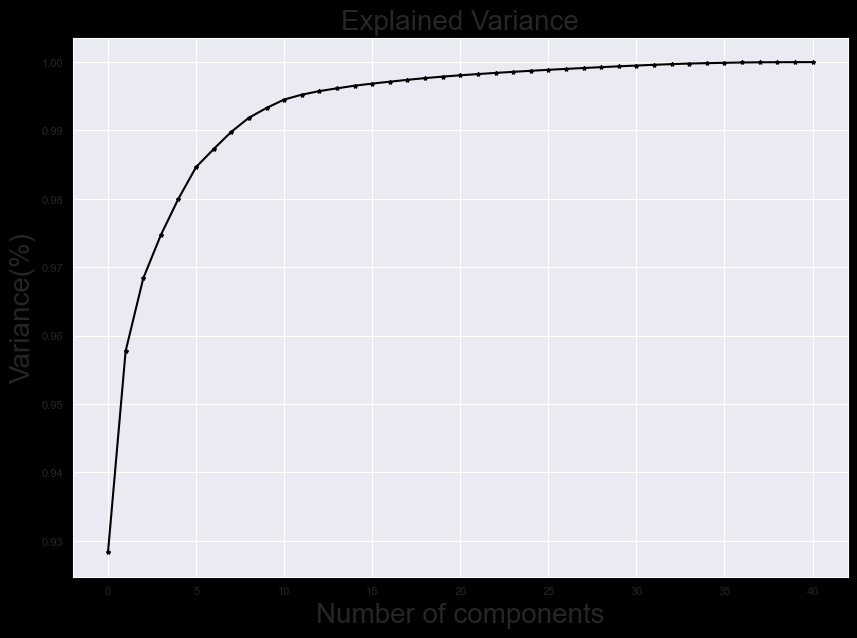

In [159]:
# Step:1 Getting optimal value of pca
from sklearn.decomposition import PCA
pca = PCA() # Object creation
principlecomponents = pca.fit_transform(data) # Fitting the data
plt.figure(figsize=(10,7))
sns.set_style('darkgrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_),marker='*',color='k') #plot the variance ratio
plt.xlabel('Number of components',fontsize=20)
plt.ylabel('Variance(%)',fontsize=20) # for each componant
plt.title('Explained Variance',fontsize=20)
plt.show()

###### This code determines the optimal number of principal components to retain in a PCA analysis by plotting the cumulative explained variance ratio. The plot helps identify the 'elbow point' where the variance explained by additional components starts to flatten, indicating the optimal number of components to keep.

In [160]:
# Step:2 Select the components
pca = PCA(n_components=10)
fifa = pca.fit_transform(data)

# Step:3 Make new dataframe
principle_df = pd.DataFrame(data=fifa,columns=['pca1','pca2','pca3','pca4','pca5','pca6','pca7','pca8','pca9','pca10'])
principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10
0,15.461256,2.015093,-0.120716,1.421170,0.341254,2.739363,1.537917,-0.620575,1.302003,-0.046904
1,14.498249,2.574933,-0.087257,1.623457,1.366016,2.168914,1.613296,0.292833,1.265567,-0.273992
2,8.528416,3.407803,-0.926819,1.136359,1.184205,2.325617,1.935479,-0.107831,1.244941,0.241164
3,-1.789442,-1.354069,-0.828835,0.997627,0.682168,1.649940,0.772428,-0.284522,0.193654,-0.255486
4,14.445248,1.825999,-0.363463,0.916801,1.017116,1.766323,1.135605,-0.397063,1.032416,0.079788


###### This code applies PCA to the dataset, retaining the top 10 principal components. It then creates a new dataframe with these components, assigning column names pca1 to pca10, and displays the first few rows of the resulting dataframe.

## K-MEANS CLUSTERING

Aim: Create a cluster on the data and get the best Silhouette score, which ranges from -1 to +1.

In [161]:
X = principle_df
X.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10
0,15.461256,2.015093,-0.120716,1.421170,0.341254,2.739363,1.537917,-0.620575,1.302003,-0.046904
1,14.498249,2.574933,-0.087257,1.623457,1.366016,2.168914,1.613296,0.292833,1.265567,-0.273992
2,8.528416,3.407803,-0.926819,1.136359,1.184205,2.325617,1.935479,-0.107831,1.244941,0.241164
3,-1.789442,-1.354069,-0.828835,0.997627,0.682168,1.649940,0.772428,-0.284522,0.193654,-0.255486
4,14.445248,1.825999,-0.363463,0.916801,1.017116,1.766323,1.135605,-0.397063,1.032416,0.079788


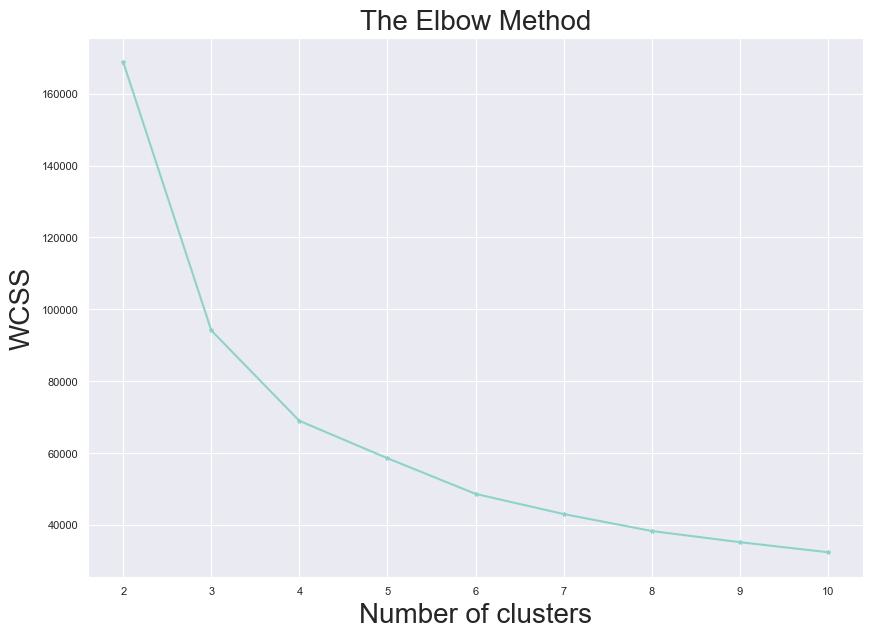

In [162]:
# Step:3 Initalize the k value
from sklearn.cluster import KMeans
kmeans = KMeans() # Object creation
wcss = [] # Create empty list

for i in range(2,11):
    kmeans = KMeans(n_clusters=i,random_state=42)
    kmeans = kmeans.fit(X)
    wcss.append(kmeans.inertia_)
plt.figure(figsize=(10,7))
plt.plot(range(2,11),wcss,marker='*')
plt.title('The Elbow Method',fontsize=20)
plt.xlabel('Number of clusters',fontsize=20)
plt.ylabel('WCSS',fontsize=20)
plt.show()

###### This code initializes a KMeans object and uses the Elbow method to determine the optimal number of clusters. It iterates from 2 to 10 clusters, calculates the WCSS (Within-Cluster Sum of Squares) for each, and plots the results to visualize the optimal cluster count.

In [163]:
# Step:3 initalize the cluster
kmeans = KMeans(n_clusters=3,random_state=45)

# Step:4 Fitting the data
kmeans.fit(X)

# Step:5  Get labels
kmeans.labels_

# Step:6 Print dataset with labels
principle_df['cluster'] = pd.DataFrame(kmeans.labels_)
principle_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,cluster
0,15.461256,2.015093,-0.120716,1.421170,0.341254,2.739363,1.537917,-0.620575,1.302003,-0.046904,2
1,14.498249,2.574933,-0.087257,1.623457,1.366016,2.168914,1.613296,0.292833,1.265567,-0.273992,2
2,8.528416,3.407803,-0.926819,1.136359,1.184205,2.325617,1.935479,-0.107831,1.244941,0.241164,1
3,-1.789442,-1.354069,-0.828835,0.997627,0.682168,1.649940,0.772428,-0.284522,0.193654,-0.255486,0
4,14.445248,1.825999,-0.363463,0.916801,1.017116,1.766323,1.135605,-0.397063,1.032416,0.079788,2


###### This code initializes a KMeans object with 3 clusters, fits the data, and assigns cluster labels to each data point. It then adds the cluster labels to the original dataset and displays the first few rows of the updated dataset.

In [164]:
kmeans.cluster_centers_

array([[-3.03251217e+00, -6.90993259e-02, -1.11911337e-02,
         4.23092174e-04,  4.01314966e-03,  2.65526219e-03,
         6.82655569e-03,  1.22633878e-02,  8.38496299e-03,
         1.66158632e-03],
       [ 4.43843567e+00,  3.74492120e-01,  5.74574053e-02,
        -1.21601679e-03, -3.33722545e-02, -2.68956104e-04,
        -2.04304069e-02, -5.31860156e-02, -5.23230468e-02,
        -7.88154663e-03],
       [ 1.34760598e+01, -2.34704589e-01, -3.16812650e-02,
        -6.97407558e-04,  3.66660583e-02, -1.89688760e-02,
        -9.64709420e-03,  1.53403961e-02,  4.21156662e-02,
         3.41686069e-03]])

## Model evaluation

Silhouette score range (-1 to +1)

- +1 ---> Samples are very close to their own cluster and far from other clusters
- 0 ---> Samples are close to the decision boundary
- 1 ---> Samples are assigned to the wrong cluster"

In [165]:
# Step:8 Create a new veriable assign to labels
labels = kmeans.labels_
labels

# Step:9 import library to evaluate the model
from sklearn.metrics import silhouette_score
silhou_score = silhouette_score(X,labels)
print("Silhouette Score:",silhou_score)

Silhouette Score: 0.6162904701323434


###### extracts the cluster labels from the KMeans object, and then uses the silhouette score to evaluate the quality of the clustering model, printing the score as a measure of how well the samples are clustered.

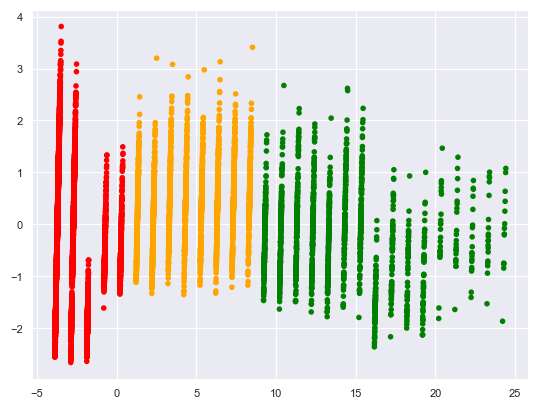

In [166]:
color = np.array(['red','orange','green'])

# Map the cluster labels to colors
colors = color[kmeans.labels_]

# Create the scatterplot
plt.scatter(principle_df.pca1, principle_df.pca2, c=colors)
plt.show()

## Conclusion

###### Based on the silhouette scores, the 3-cluster model (0.6162) is preferred over the 5-cluster model (0.5011) as it indicates better separation and cohesion within the clusters.

#### Model saving

In [167]:
# Model saving using pickle
import pickle
file = open("kmeans_clustering_model.pkl","wb")
pickle.dump(kmeans,file)